# Parte 1 del ejercicio del módulo 5

**Este notebook tarda unos 15 minutos en ejecutarse**


# Información sobre el Dataset de Airbnb NYC 2019

El conjunto de datos **AB_NYC_2019.csv** proporciona información sobre los alojamientos en **Nueva York** disponibles en Airbnb durante el año **2019**. A través de este dataset, podemos analizar tendencias de precios, disponibilidad, características de los anfitriones y otros factores relevantes para el mercado del alquiler a corto plazo.

## 🔍 **Estructura del Dataset**  

Este dataset contiene **48,895 registros** y **16 columnas**, que se pueden dividir en diferentes categorías:

| **Categoría**       | **Columnas** | **Descripción** |
|---------------------|-------------|---------------|
| 📍 **Ubicación**  | `neighbourhood_group`, `neighbourhood`, `latitude`, `longitude` | Información geográfica del alojamiento. |
| 🏠 **Propiedad**  | `room_type`, `name` | Tipo de propiedad y nombre del anuncio. |
| 💰 **Precio y Disponibilidad** | `price`, `minimum_nights`, `availability_365` | Precio por noche, estancia mínima y disponibilidad anual. |
| 👤 **Anfitrión**  | `host_id`, `host_name` | Identificación y nombre del anfitrión. |
| 🏅 **Calificaciones y Popularidad** | `number_of_reviews`, `reviews_per_month`, `last_review` | Cantidad de reseñas y última fecha de revisión. |

## 📊 **Posibles Preguntas de Análisis**
Este dataset nos permite responder preguntas clave sobre el mercado de Airbnb en Nueva York:

### **1️⃣ Análisis Exploratorio (EDA)**
- ¿Cuál es la distribución de precios en diferentes barrios y tipos de alojamiento?
- ¿Cómo varía la disponibilidad según la ubicación y la época del año?
- ¿Existen patrones de reseñas y popularidad en ciertos barrios?
- ¿Qué barrios tienen los precios más altos y cuáles los más bajos?

### **2️⃣ Análisis de Tendencias y Predicciones**
- ¿Qué factores influyen más en el precio del alojamiento?
- ¿Podemos predecir el precio de una propiedad basándonos en sus características?
- ¿Qué tan importante es la experiencia del anfitrión en la cantidad de reservas?

### **3️⃣ Análisis de Hosts y Competencia**
- ¿Cuántos alojamientos tiene un mismo anfitrión? ¿Hay superanfitriones con muchas propiedades?
- ¿Los anfitriones con más reseñas tienen precios más altos o más bajos?
- ¿Existen diferencias significativas entre hosts individuales y empresas?

### **4️⃣ Análisis Geoespacial**
- ¿Cuáles son los barrios más populares en términos de número de alojamientos y reseñas?
- ¿Cómo varía la disponibilidad de alojamientos en función de la ubicación?
- ¿Los precios están correlacionados con la ubicación?


## 🔬 **Aspectos Destacados del Dataset**
📍 **Distribución por Zonas:** Se incluyen los 5 distritos de Nueva York: **Manhattan, Brooklyn, Queens, Bronx y Staten Island.**  

💰 **Precios Variables:** Desde alojamientos económicos hasta propiedades de lujo, lo que permite analizar la disparidad de precios.  

🏠 **Diversidad de Tipos de Habitaciones:** Incluye **apartamentos completos, habitaciones privadas y habitaciones compartidas**, lo que permite estudiar la preferencia de los usuarios.  

📅 **Datos de Disponibilidad:** La variable `availability_365` permite analizar qué alojamientos están disponibles todo el año y cuáles son de uso ocasional.  

⭐ **Popularidad de Anuncios:** Variables como `number_of_reviews` y `reviews_per_month` permiten analizar cuáles son los alojamientos más populares y con mayor feedback de los huéspedes.  

📌 **Tiempo desde la Última Reseña:** `last_review` nos permite analizar la actividad reciente del anuncio. `Al ser un database estático, y tener nulos en las columnas anteriores, la vamos a quitar`


## 📈 **Posibles Modelos para Aplicar en el Análisis**
Dado que ya hemos iniciado el análisis, estos son algunos enfoques que podemos aplicar:

### **🔹 Predicción de Precios (Regresión)**
✅ Utilizar modelos de **Machine Learning (Regresión Lineal, Random Forest, XGBoost, etc.)** para predecir el precio en función de ubicación, tipo de habitación, número de reseñas y otros factores.

### **🔹 Clasificación de Tipo de Habitación**
✅ Aplicar **Clasificación Multiclase** (`room_type`) con algoritmos como **Random Forest, SVM o redes neuronales (Keras/TensorFlow).**

### **🔹 Análisis de Clusters (K-Means, DBSCAN)**
✅ Identificar grupos de alojamientos con características similares, basados en precio, disponibilidad y ubicación.

### **🔹 Feature Selection y Reducción de Dimensionalidad**
✅ Aplicar **PCA (Análisis de Componentes Principales)** o **SelectKBest** para optimizar el conjunto de características antes de entrenar modelos.

### **🔹 Análisis de Outliers**
✅ Identificar propiedades con precios anormalmente altos o bajos utilizando el **método de Tukey (IQR)**.


## 🔎 **Conclusión**
Este dataset de Airbnb en Nueva York es ideal para explorar tendencias del mercado, hacer predicciones y entender el comportamiento de los alojamientos en función de su precio, ubicación y disponibilidad. Además, permite aplicar técnicas avanzadas de Machine Learning y análisis geoespacial para obtener información valiosa tanto para anfitriones como para posibles huéspedes.

## Dataset Airbnb NYC https://www.kaggle.com/datasets/dgomonov/new-york-city-airbnb-open-data AB_NYC_2019.csv


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder

In [2]:
# Cargar el dataset
file_path = "../Data/airbnb_nyc_clean.csv"  # Ruta del archivo subido
df = pd.read_csv(file_path)

In [3]:
# Mostrar información general del dataset
print("Información del Dataset:")
print(df.info())

Información del Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69305 entries, 0 to 69304
Data columns (total 23 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              69305 non-null  int64  
 1   name                            69305 non-null  object 
 2   host_id                         69305 non-null  int64  
 3   host_identity_verified          69305 non-null  object 
 4   host_name                       69305 non-null  object 
 5   neighbourhood_group             69305 non-null  object 
 6   neighbourhood                   69305 non-null  object 
 7   lat                             69305 non-null  float64
 8   long                            69305 non-null  float64
 9   instant_bookable                69305 non-null  bool   
 10  cancellation_policy             69305 non-null  object 
 11  room_type                       69305 non-null  object 
 12  constru

Información del Dataset:
RangeIndex: 69305 entries, 0 to 69304
Data columns (total 23 columns):

dtypes: bool(1), float64(11), int64(2), object(9)
memory usage: 11.7+ MB


In [4]:
# Mostrar las primeras filas del dataset
df.head()

,id,name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,lat,long,instant_bookable,...,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365,house_rules
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,False,...,966.0,193.0,10.0,9.0,2021-10-19,0.21,4.0,6.0,286.0,Clean up and treat the home the way you'd like...
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,False,...,142.0,28.0,13.0,45.0,2022-05-21,0.38,4.0,2.0,228.0,Pet friendly but please confirm with me if the...
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,unconfirmed,Elise,Manhattan,Harlem,40.80902,-73.94190,True,...,620.0,124.0,3.0,0.0,2019-06-14,0.79,5.0,1.0,352.0,"I encourage you to use my kitchen, cooking and..."
3,1002755,blank,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.68514,-73.95976,True,...,368.0,74.0,13.0,270.0,2019-07-05,4.64,4.0,1.0,322.0,blank
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.79851,-73.94399,False,...,204.0,41.0,10.0,9.0,2018-11-19,0.10,3.0,1.0,289.0,"Please no smoking in the house, porch or on th..."


In [5]:
# Descripción estadística de las columnas numéricas
print("\n Descripción Estadística (13 columnas Numéricas):")
print(df.describe())


 Descripción Estadística (13 columnas Numéricas):
                 id       host_id           lat          long  \
count  6.930500e+04  6.930500e+04  69305.000000  69305.000000   
mean   2.015746e+07  4.929192e+10     40.728070    -73.949036   
std    1.109105e+07  2.854010e+10      0.055973      0.050470   
min    1.001254e+06  1.303496e+08     40.499790    -74.249840   
25%    1.057049e+07  2.459948e+10     40.688540    -73.982790   
50%    2.013964e+07  4.915407e+10     40.722650    -73.954390   
75%    2.970878e+07  7.406137e+10     40.762730    -73.931380   
max    5.736355e+07  9.876313e+10     40.916970    -73.705220   

       construction_year         price   service_fee  minimum_nights  \
count       69305.000000  69305.000000  69305.000000    69305.000000   
mean         2012.489503    624.736070    124.894026        4.620330   
std             5.756144    331.158937     66.222794        4.356887   
min          2003.000000     50.000000     10.000000        0.000000   
25%

In [6]:
# Descripción estadística de las columnas categóricas
print("\n Descripción Estadística (9 columnas Categóricas):")
print(df.describe(include='object'))


 Descripción Estadística (9 columnas Categóricas):
         name host_identity_verified host_name neighbourhood_group  \
count   69305                  69305     69305               69305   
unique  61234                      2     13191                   5   
top     blank            unconfirmed   Michael           Manhattan   
freq      208                  34779       582               29587   

             neighbourhood cancellation_policy        room_type last_review  \
count                69305               69305            69305       69305   
unique                 239                   3                4        2472   
top     Bedford-Stuyvesant            moderate  Entire home/apt  2019-06-14   
freq                  5331               23244            37212       11100   

       house_rules  
count        69305  
unique        1977  
top          blank  
freq         36645  


In [7]:
df.shape # (69305, 23)

(69305, 23)

In [8]:
df.keys()  # obtenemos los nombres de las columnas
df_index = (['id', 'name', 'host_id', 'host_identity_verified', 'host_name',
       'neighbourhood_group', 'neighbourhood', 'lat', 'long',
       'instant_bookable', 'cancellation_policy', 'room_type',
       'construction_year', 'price', 'service_fee', 'minimum_nights',
       'number_of_reviews', 'last_review', 'reviews_per_month',
       'review_rate_number', 'calculated_host_listings_count',
       'availability_365', 'house_rules'])
print(df_index)

['id', 'name', 'host_id', 'host_identity_verified', 'host_name', 'neighbourhood_group', 'neighbourhood', 'lat', 'long', 'instant_bookable', 'cancellation_policy', 'room_type', 'construction_year', 'price', 'service_fee', 'minimum_nights', 'number_of_reviews', 'last_review', 'reviews_per_month', 'review_rate_number', 'calculated_host_listings_count', 'availability_365', 'house_rules']


In [9]:
df.empty # nos dice si el dataframe está vacío

False

In [10]:
# Comprobar si hay valores nulos en cada columna 
print("Número de valores nulos por columna:") 
print(df.isnull().sum()) 

Número de valores nulos por columna:
id                                0
name                              0
host_id                           0
host_identity_verified            0
host_name                         0
neighbourhood_group               0
neighbourhood                     0
lat                               0
long                              0
instant_bookable                  0
cancellation_policy               0
room_type                         0
construction_year                 0
price                             0
service_fee                       0
minimum_nights                    0
number_of_reviews                 0
last_review                       0
reviews_per_month                 0
review_rate_number                0
calculated_host_listings_count    0
availability_365                  0
house_rules                       0
dtype: int64


In [11]:
# Revisar valores duplicados
print("\n Valores Duplicados en el Dataset:")
print(f"Total de filas duplicadas: {df.duplicated().sum()}")


 Valores Duplicados en el Dataset:
Total de filas duplicadas: 0


In [12]:
# Find number of unique values in the dataset
for col in df.columns:
    print(f'Column {col} \t has {df[col].nunique()} unique values')


Column id 	 has 69305 unique values
Column name 	 has 61234 unique values
Column host_id 	 has 69304 unique values
Column host_identity_verified 	 has 2 unique values
Column host_name 	 has 13191 unique values
Column neighbourhood_group 	 has 5 unique values
Column neighbourhood 	 has 239 unique values
Column lat 	 has 21998 unique values
Column long 	 has 17780 unique values
Column instant_bookable 	 has 2 unique values
Column cancellation_policy 	 has 3 unique values
Column room_type 	 has 4 unique values
Column construction_year 	 has 20 unique values
Column price 	 has 1152 unique values
Column service_fee 	 has 232 unique values
Column minimum_nights 	 has 14 unique values
Column number_of_reviews 	 has 476 unique values
Column last_review 	 has 2472 unique values
Column reviews_per_month 	 has 1016 unique values
Column review_rate_number 	 has 5 unique values
Column calculated_host_listings_count 	 has 78 unique values
Column availability_365 	 has 437 unique values
Column house_

In [13]:
# Let's check the host_identity_verified value count
df.host_identity_verified.value_counts()

host_identity_verified
unconfirmed    34779
verified       34526
Name: count, dtype: int64

In [14]:
# Let's check the neighbourhood group values
df['neighbourhood_group'].value_counts()

neighbourhood_group
Manhattan        29587
Brooklyn         27895
Queens            9262
Bronx             1912
Staten Island      649
Name: count, dtype: int64

In [15]:
df.neighbourhood.value_counts().sort_values(ascending=False)[:10]

neighbourhood
Bedford-Stuyvesant    5331
Williamsburg          5079
Harlem                3659
Bushwick              3270
Hell's Kitchen        2817
Upper West Side       2601
Upper East Side       2460
Midtown               2317
East Village          2285
Crown Heights         2173
Name: count, dtype: int64

### Quitar columnas: id, host_id, host_name

In [16]:
#  Eliminar columnas id, name, host_id y host_name
df.drop(columns=['id', 'name', 'host_id', 'host_name'], inplace=True, errors='ignore', axis=1)
print(df.shape)

(69305, 19)


### Fecha: probar a descomponer la fecha en campos año mes y día con pandas es decir, en 3 columnas, por ejemplo usando to_datetime de pandas y los accesores de fecha para extraer año mes y día.

In [17]:
# Convertir la columna de fecha `last_review` a tipo datetime
df['last_review'] = pd.to_datetime(df['last_review'], errors='coerce')

# Crear nuevas columnas para año, mes y día
df['review_year'] = df['last_review'].dt.year
df['review_month'] = df['last_review'].dt.month
df['review_day'] = df['last_review'].dt.day

# Verificar cambios
print("Nuevas columnas creadas:")
print(df[['last_review', 'review_year', 'review_month', 'review_day']].head())

Nuevas columnas creadas:
  last_review  review_year  review_month  review_day
0  2021-10-19         2021            10          19
1  2022-05-21         2022             5          21
2  2019-06-14         2019             6          14
3  2019-07-05         2019             7           5
4  2018-11-19         2018            11          19


In [18]:
# Eliminar la columna original `last_review` si ya no es necesaria
df.drop(columns=['last_review'], inplace=True, errors='ignore', axis=1)

In [19]:
# quitar caracteres de la columna barrio
df['neighbourhood'] = df['neighbourhood'].str.replace('-', '').str.replace('"', '').str.replace("'", '').str.replace(' ', '_').str.replace('*',' ').str.replace('$',' ')

In [20]:
# Verificar estructura final del dataset
print("\n Dataset después del preprocesamiento:")
print(df.info())

# Guardar el dataset preprocesado
df.to_csv("dataset_limpio.csv", index=False)


 Dataset después del preprocesamiento:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69305 entries, 0 to 69304
Data columns (total 21 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   host_identity_verified          69305 non-null  object 
 1   neighbourhood_group             69305 non-null  object 
 2   neighbourhood                   69305 non-null  object 
 3   lat                             69305 non-null  float64
 4   long                            69305 non-null  float64
 5   instant_bookable                69305 non-null  bool   
 6   cancellation_policy             69305 non-null  object 
 7   room_type                       69305 non-null  object 
 8   construction_year               69305 non-null  float64
 9   price                           69305 non-null  float64
 10  service_fee                     69305 non-null  float64
 11  minimum_nights                  69305 non-null  float

## EDAs (10%) (menos foco para este módulo)


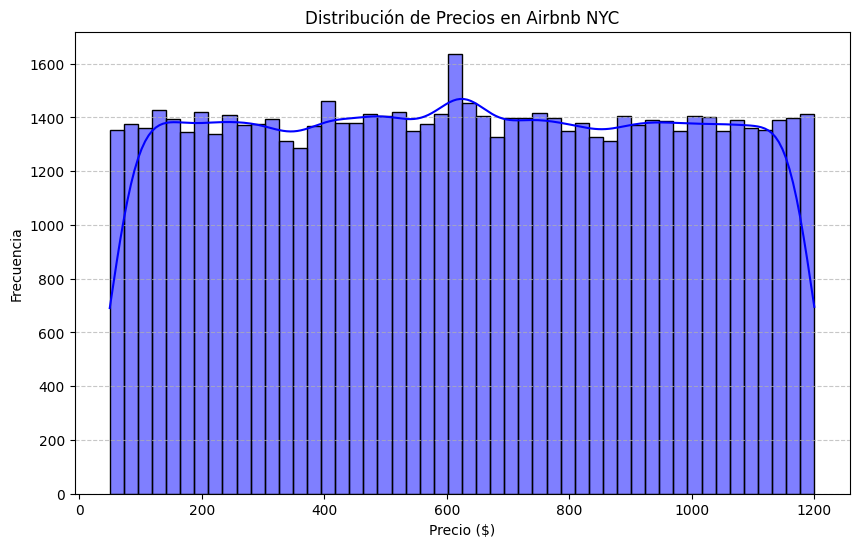

In [21]:
# Visualización de la distribución de precios
plt.figure(figsize=(10, 6))
sns.histplot(df['price'], bins=50, kde=True, color='blue')
plt.title("Distribución de Precios en Airbnb NYC")
plt.xlabel("Precio ($)")
plt.ylabel("Frecuencia")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

### comparar precios por barrios, ver cual es mas caro

In [22]:
print(df['price'].min())
print(df['price'].max())

50.0
1200.0


C:\Users\carol\AppData\Local\Temp\ipykernel_47236\994698757.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=valores_por_barrio.index, y=valores_por_barrio.values, palette='viridis')


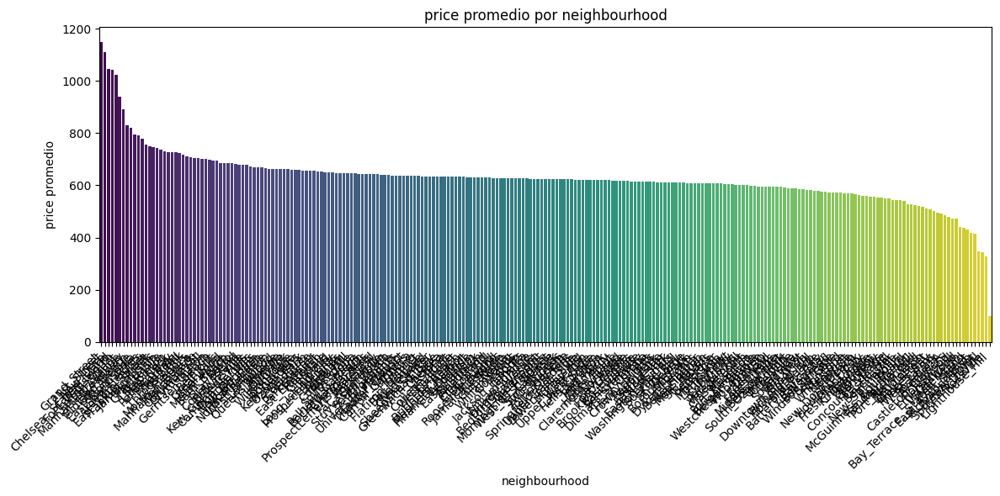

C:\Users\carol\AppData\Local\Temp\ipykernel_47236\994698757.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=precios_por_barrio_stat.index, y=precios_por_barrio_stat['mean'], palette='viridis')


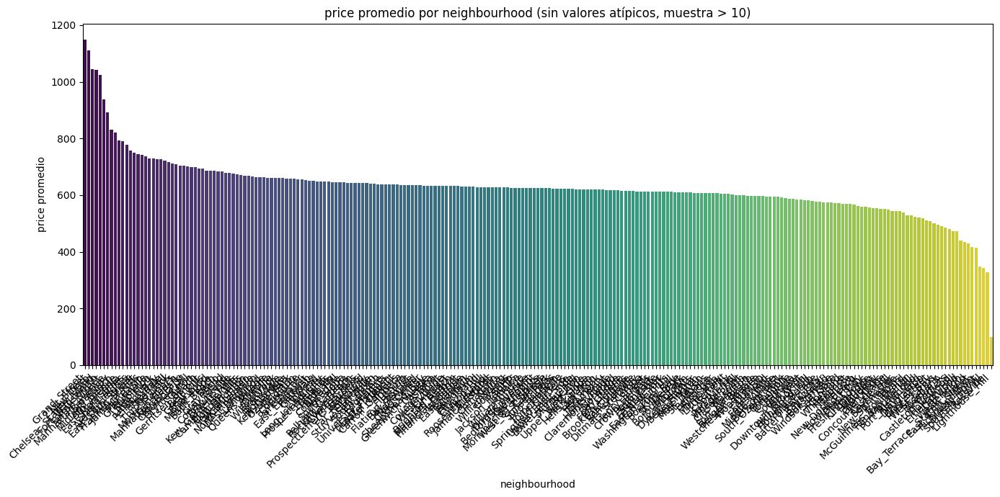

C:\Users\carol\AppData\Local\Temp\ipykernel_47236\994698757.py:44: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=columna_cat, y=columna_analizar, data=df[df[columna_cat].isin(precios_por_barrio_stat.index)], palette='viridis')


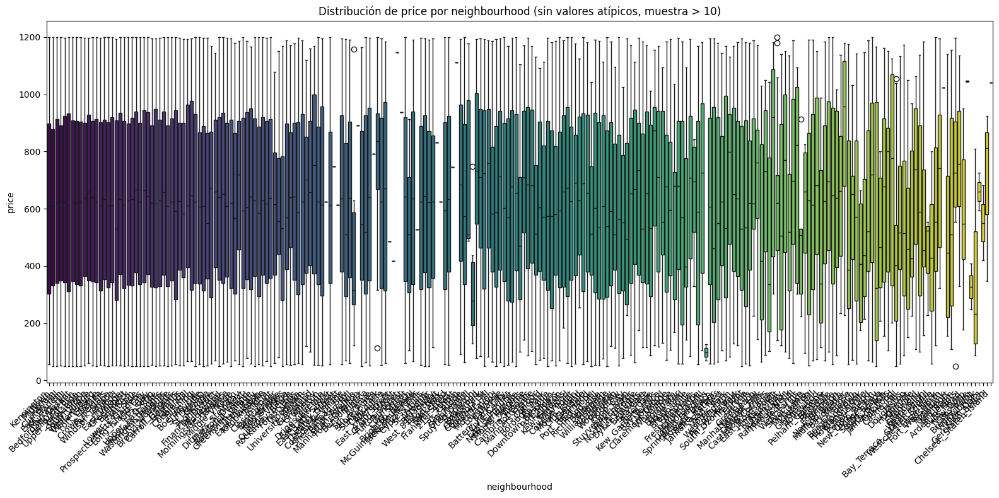

C:\Users\carol\AppData\Local\Temp\ipykernel_47236\994698757.py:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=precios_por_barrio_stat.index, y=precios_por_barrio_stat['median'], palette='viridis')


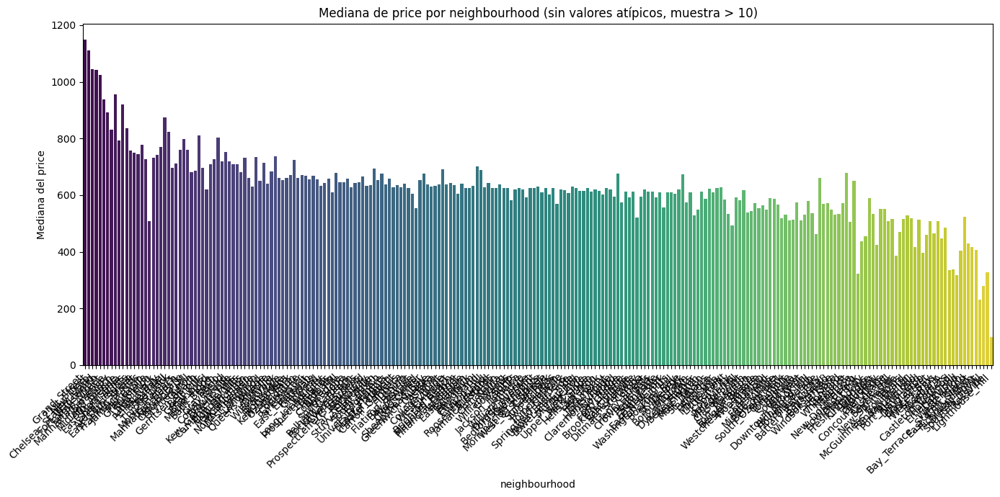

13


C:\Users\carol\AppData\Local\Temp\ipykernel_47236\994698757.py:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_10_altos.index, y=top_10_altos.values, palette='viridis')


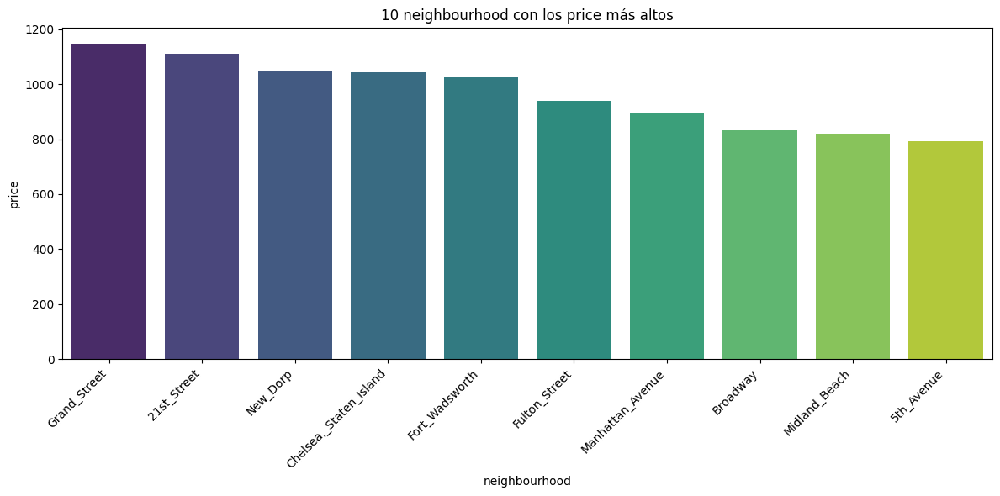

C:\Users\carol\AppData\Local\Temp\ipykernel_47236\994698757.py:84: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_10_bajos.index, y=top_10_bajos.values, palette='viridis')


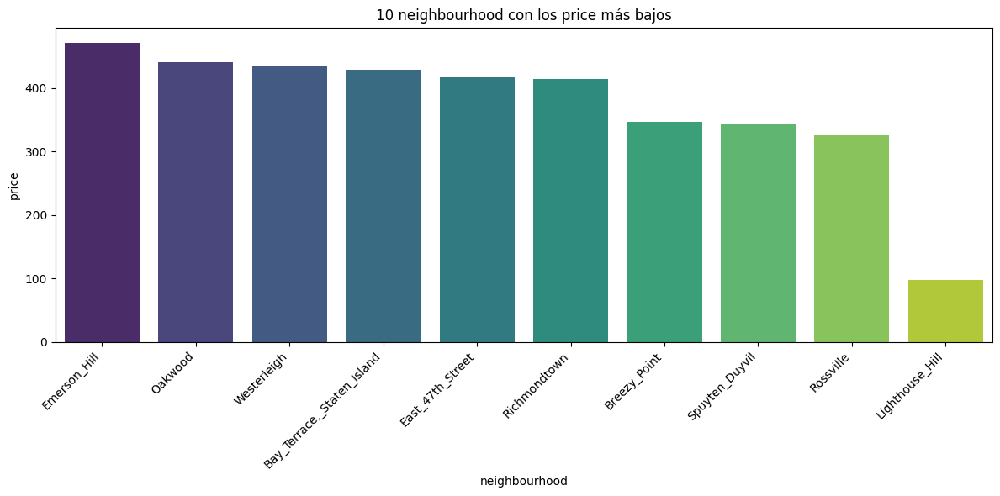

10 neighbourhood con los price más altos:
neighbourhood
Grand_Street              1148.000000
21st_Street               1111.000000
New_Dorp                  1046.000000
Chelsea,_Staten_Island    1042.000000
Fort_Wadsworth            1024.000000
Fulton_Street              938.000000
Manhattan_Avenue           892.000000
Broadway                   831.000000
Midland_Beach              820.615385
5th_Avenue                 793.000000
Name: price, dtype: float64

10 neighbourhood con los price más bajos:
neighbourhood
Emerson_Hill                  471.714286
Oakwood                       440.454545
Westerleigh                   435.666667
Bay_Terrace,_Staten_Island    429.500000
East_47th_Street              417.000000
Richmondtown                  413.750000
Breezy_Point                  346.714286
Spuyten_Duyvil                342.666667
Rossville                     327.500000
Lighthouse_Hill                98.000000
Name: price, dtype: float64


In [23]:
def comparar_valores_barrios(df, columna_cat, columna_analizar):

    # 2. Manejo de valores atípicos
    # Ajusta los umbrales según la columna que estés analizando
    if columna_analizar == 'price':
        df_filtrado = df[(df[columna_analizar] > 10) & (df[columna_analizar] < 100000)]
    else:
        df_filtrado = df  # Si no es 'price', no se aplican filtros

    # 3. Agrupar por barrios y calcular métricas
    valores_por_barrio = df_filtrado.groupby(columna_cat)[columna_analizar].mean().sort_values(ascending=False)

    # Visualizar los resultados
    plt.figure(figsize=(12, 6))
    sns.barplot(x=valores_por_barrio.index, y=valores_por_barrio.values, palette='viridis')
    plt.title(f'{columna_analizar} promedio por {columna_cat}')
    plt.xlabel(columna_cat)
    plt.ylabel(f'{columna_analizar} promedio')
    plt.xticks(rotation=45, ha='right')  # Rotar etiquetas del eje x para mejor legibilidad
    plt.tight_layout()
    plt.savefig(f'{columna_analizar} promedio por {columna_cat}.png')  # Guardar gráfico
    plt.show()

    # 3. Agrupar por barrios y calcular métricas
    precios_por_barrio_stat = df_filtrado.groupby(columna_cat)[columna_analizar].agg(['mean', 'median', 'std', 'count'])
    precios_por_barrio_stat = precios_por_barrio_stat.sort_values(by='mean', ascending=False)
    
    # 4. Filtrar barrios con tamaño de muestra pequeño (ejemplo)
    precios_por_barrio_stat_10 = precios_por_barrio_stat[precios_por_barrio_stat['count'] > 10]

    # 5. Visualización: Gráfico de barras (precio promedio)
    plt.figure(figsize=(14, 7))
    sns.barplot(x=precios_por_barrio_stat.index, y=precios_por_barrio_stat['mean'], palette='viridis')
    plt.title(f'{columna_analizar} promedio por {columna_cat} (sin valores atípicos, muestra > 10)')
    plt.xlabel(columna_cat)
    plt.ylabel(f'{columna_analizar} promedio')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.savefig(f'{columna_analizar} promedio por {columna_cat} sin valores atípicos.png')
    plt.show()

    # 6. Visualización: Boxplots (distribución de precios)
    plt.figure(figsize=(16, 8))
    sns.boxplot(x=columna_cat, y=columna_analizar, data=df[df[columna_cat].isin(precios_por_barrio_stat.index)], palette='viridis')
    plt.title(f'Distribución de {columna_analizar} por {columna_cat} (sin valores atípicos, muestra > 10)')
    plt.xlabel(columna_cat)
    plt.ylabel(columna_analizar)
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.savefig(f'Distribución de {columna_analizar} por {columna_cat} sin valores atípicos.png')
    plt.show()

    # 7. Visualización: Mediana de precios por barrio
    plt.figure(figsize=(14, 7))
    sns.barplot(x=precios_por_barrio_stat.index, y=precios_por_barrio_stat['median'], palette='viridis')
    plt.title(f'Mediana de {columna_analizar} por {columna_cat} (sin valores atípicos, muestra > 10)')
    plt.xlabel(columna_cat)
    plt.ylabel(f'Mediana del {columna_analizar}')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.savefig(f'Mediana de {columna_analizar} por {columna_cat} sin valores atípicos.png')
    plt.show()

    print(len(columna_cat))
    
    if (len(columna_cat) >= 10):
        # 4. Obtener los 10 barrios con los valores más altos y más bajos
        top_10_altos = valores_por_barrio.head(10)
        top_10_bajos = valores_por_barrio.tail(10)

        # 5. Visualización: 10 barrios con los valores más altos
        plt.figure(figsize=(12, 6))
        sns.barplot(x=top_10_altos.index, y=top_10_altos.values, palette='viridis')
        plt.title(f'10 {columna_cat} con los {columna_analizar} más altos')
        plt.xlabel(columna_cat)
        plt.ylabel(columna_analizar)
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.savefig(f"{columna_cat}_{columna_analizar}_10_altos.png")  # Guardar gráfico
        plt.show()

        # 6. Visualización: 10 barrios con los valores más bajos
        plt.figure(figsize=(12, 6))
        sns.barplot(x=top_10_bajos.index, y=top_10_bajos.values, palette='viridis')
        plt.title(f'10 {columna_cat} con los {columna_analizar} más bajos')
        plt.xlabel(columna_cat)
        plt.ylabel(columna_analizar)
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.savefig(f"{columna_cat}_{columna_analizar}_10_bajos.png")  # Guardar gráfico
        plt.show()

        # 7. Imprimir los resultados en formato de tabla
        print(f"10 {columna_cat} con los {columna_analizar} más altos:")
        print(top_10_altos)
        print(f"\n10 {columna_cat} con los {columna_analizar} más bajos:")
        print(top_10_bajos)

# Ejemplo de uso

comparar_valores_barrios(df, 'neighbourhood', 'price')

El barrio más caro es Grand_Street y el más barato es LightHouse_Hill

C:\Users\carol\AppData\Local\Temp\ipykernel_47236\994698757.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=valores_por_barrio.index, y=valores_por_barrio.values, palette='viridis')


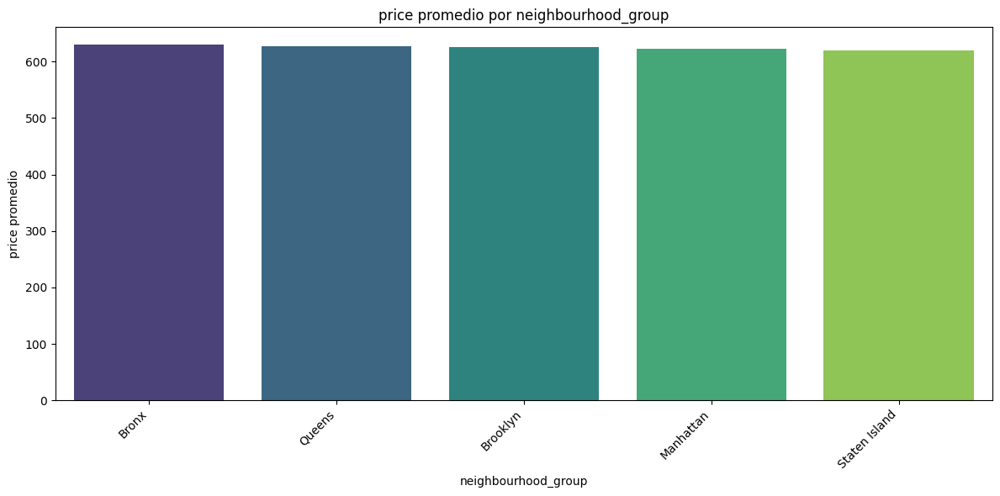

C:\Users\carol\AppData\Local\Temp\ipykernel_47236\994698757.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=precios_por_barrio_stat.index, y=precios_por_barrio_stat['mean'], palette='viridis')


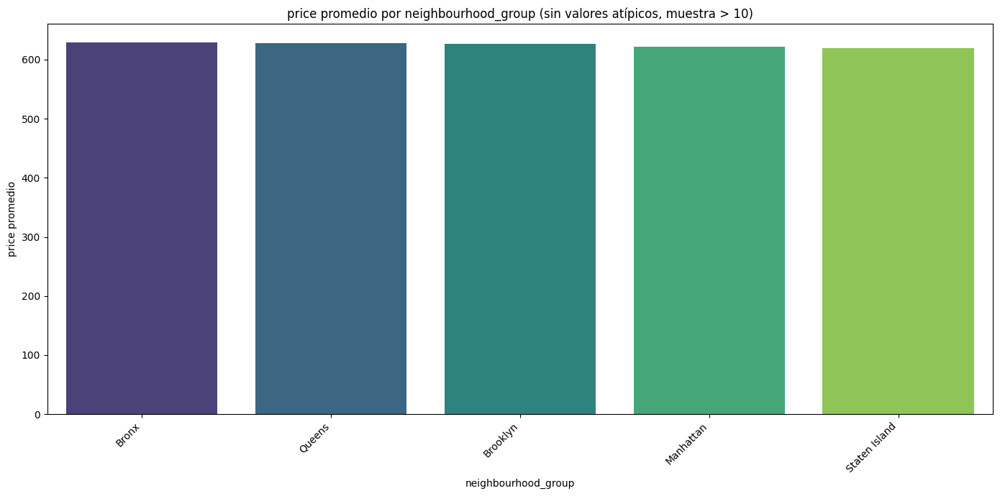

C:\Users\carol\AppData\Local\Temp\ipykernel_47236\994698757.py:44: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=columna_cat, y=columna_analizar, data=df[df[columna_cat].isin(precios_por_barrio_stat.index)], palette='viridis')


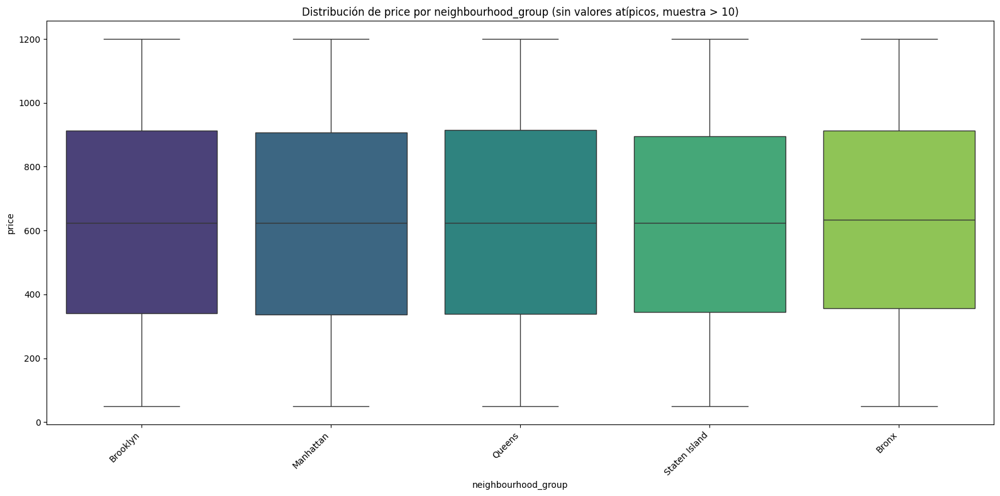

C:\Users\carol\AppData\Local\Temp\ipykernel_47236\994698757.py:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=precios_por_barrio_stat.index, y=precios_por_barrio_stat['median'], palette='viridis')


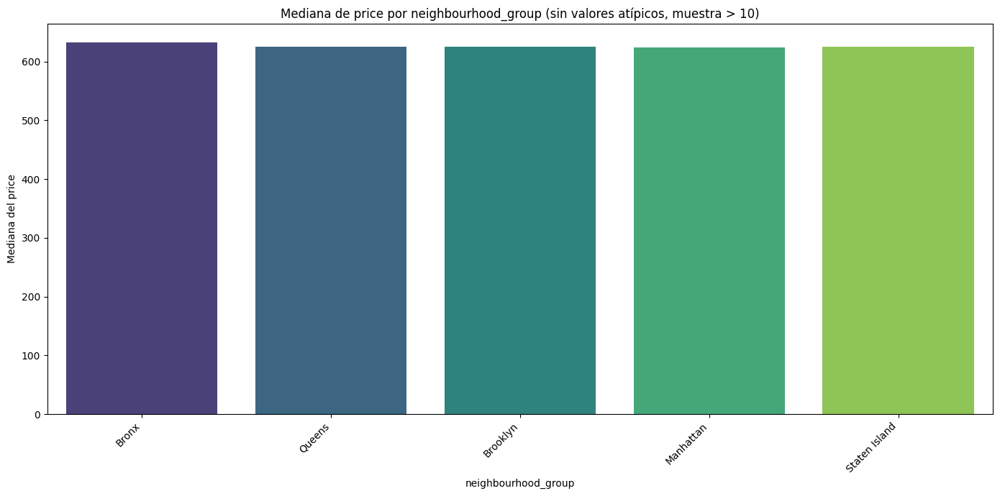

C:\Users\carol\AppData\Local\Temp\ipykernel_47236\994698757.py:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_10_altos.index, y=top_10_altos.values, palette='viridis')


19


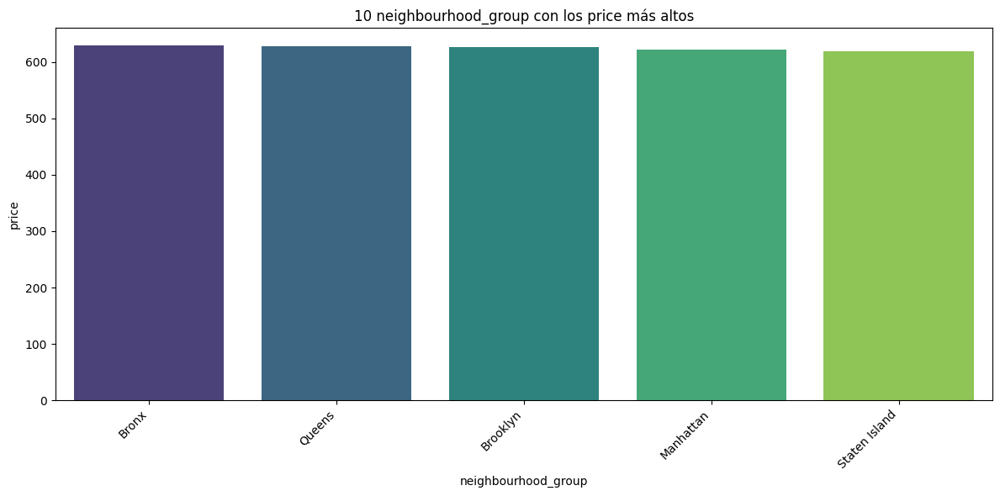

C:\Users\carol\AppData\Local\Temp\ipykernel_47236\994698757.py:84: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_10_bajos.index, y=top_10_bajos.values, palette='viridis')


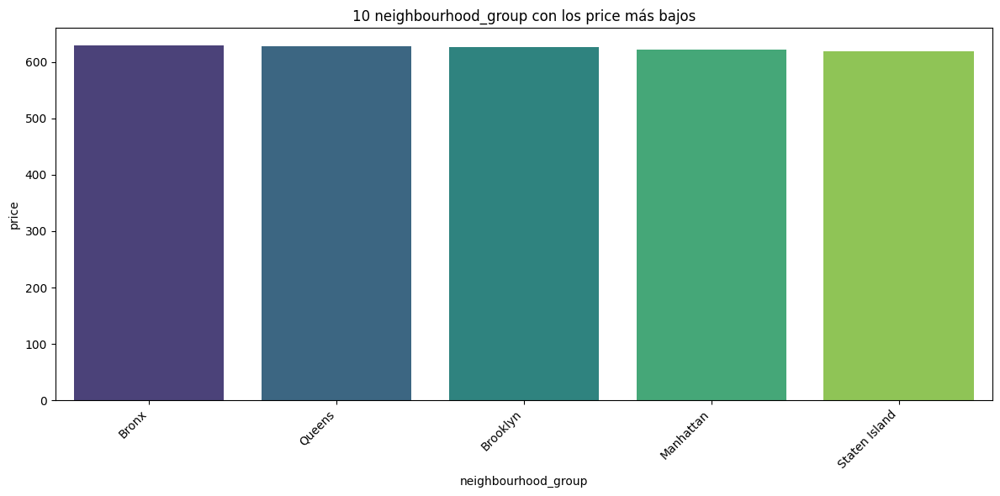

10 neighbourhood_group con los price más altos:
neighbourhood_group
Bronx            629.491189
Queens           627.898325
Brooklyn         626.276070
Manhattan        622.101014
Staten Island    619.534990
Name: price, dtype: float64

10 neighbourhood_group con los price más bajos:
neighbourhood_group
Bronx            629.491189
Queens           627.898325
Brooklyn         626.276070
Manhattan        622.101014
Staten Island    619.534990
Name: price, dtype: float64


In [24]:
comparar_valores_barrios(df, 'neighbourhood_group', 'price')

(son los mismos valores, porque solo hay 5 distritos y estoy pidiendo que de los 10 más caros y los 10 más baratos)

El precio promedio es muy similar en los 5 distritos

C:\Users\carol\AppData\Local\Temp\ipykernel_47236\994698757.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=valores_por_barrio.index, y=valores_por_barrio.values, palette='viridis')


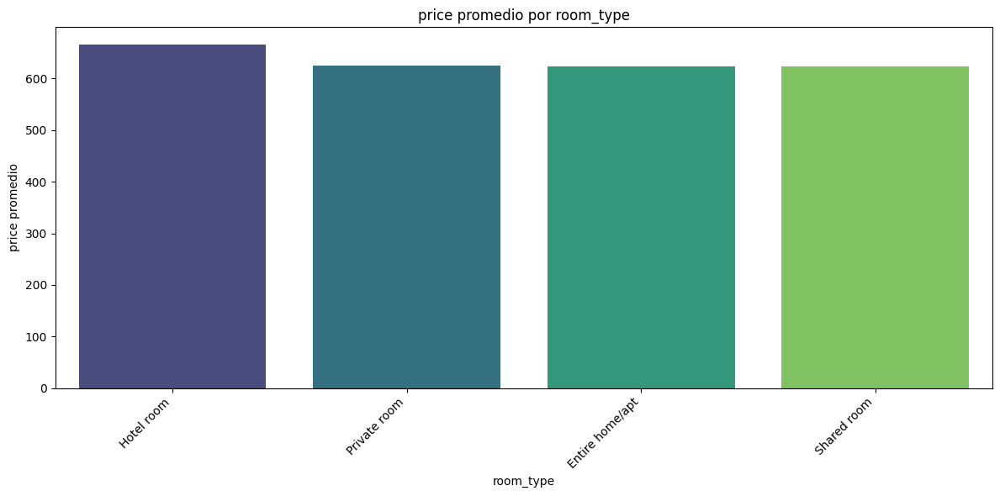

C:\Users\carol\AppData\Local\Temp\ipykernel_47236\994698757.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=precios_por_barrio_stat.index, y=precios_por_barrio_stat['mean'], palette='viridis')


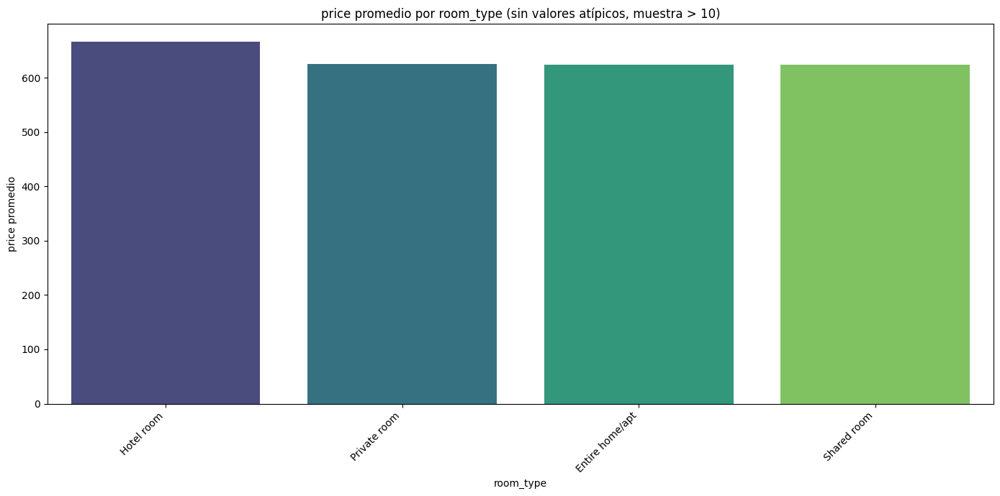

C:\Users\carol\AppData\Local\Temp\ipykernel_47236\994698757.py:44: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=columna_cat, y=columna_analizar, data=df[df[columna_cat].isin(precios_por_barrio_stat.index)], palette='viridis')


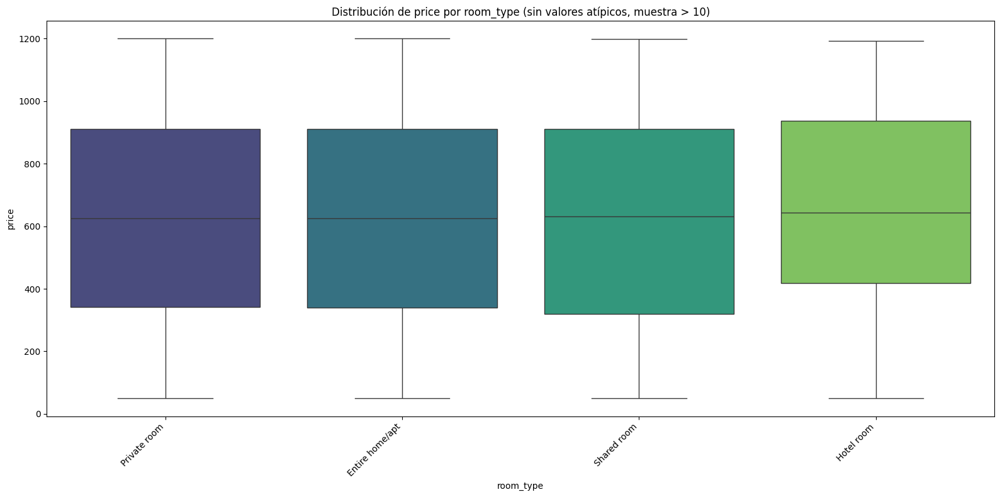

C:\Users\carol\AppData\Local\Temp\ipykernel_47236\994698757.py:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=precios_por_barrio_stat.index, y=precios_por_barrio_stat['median'], palette='viridis')


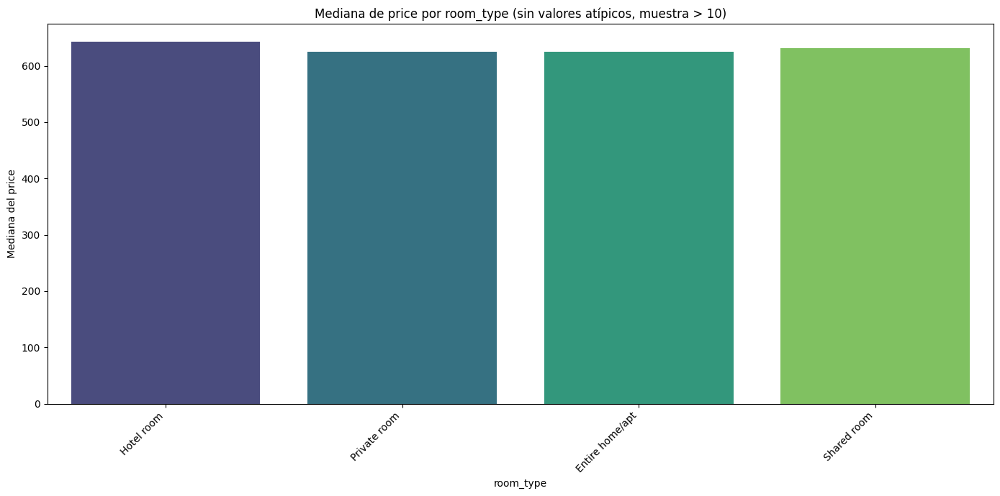

9


In [25]:
comparar_valores_barrios(df, 'room_type', 'price')

C:\Users\carol\AppData\Local\Temp\ipykernel_47236\994698757.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=valores_por_barrio.index, y=valores_por_barrio.values, palette='viridis')


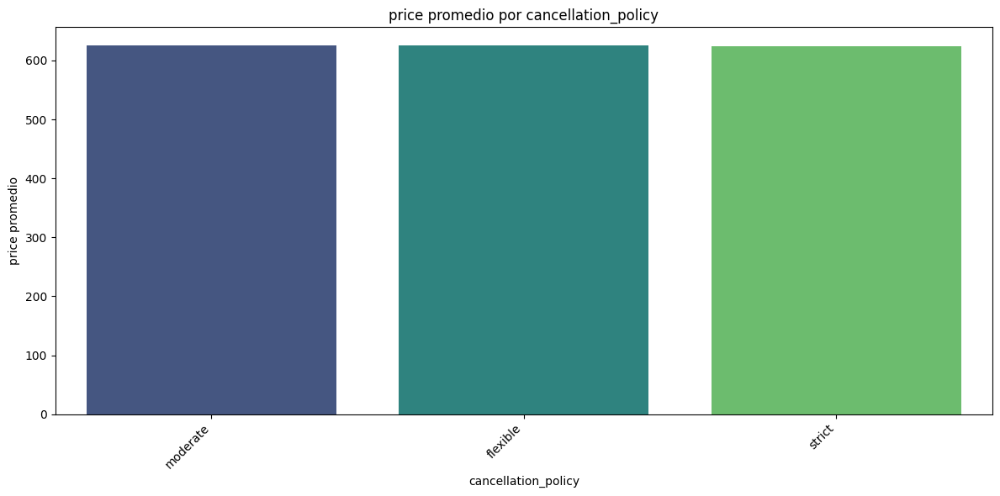

C:\Users\carol\AppData\Local\Temp\ipykernel_47236\994698757.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=precios_por_barrio_stat.index, y=precios_por_barrio_stat['mean'], palette='viridis')


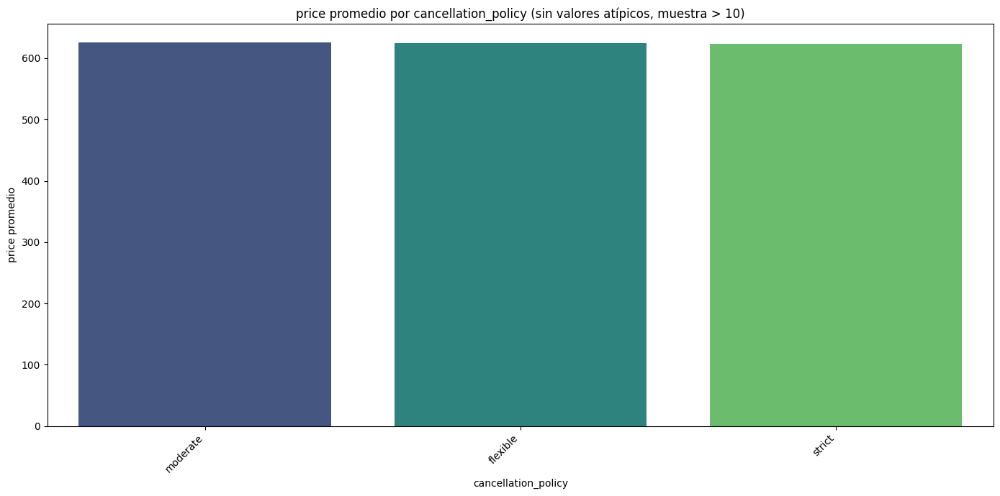

C:\Users\carol\AppData\Local\Temp\ipykernel_47236\994698757.py:44: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=columna_cat, y=columna_analizar, data=df[df[columna_cat].isin(precios_por_barrio_stat.index)], palette='viridis')


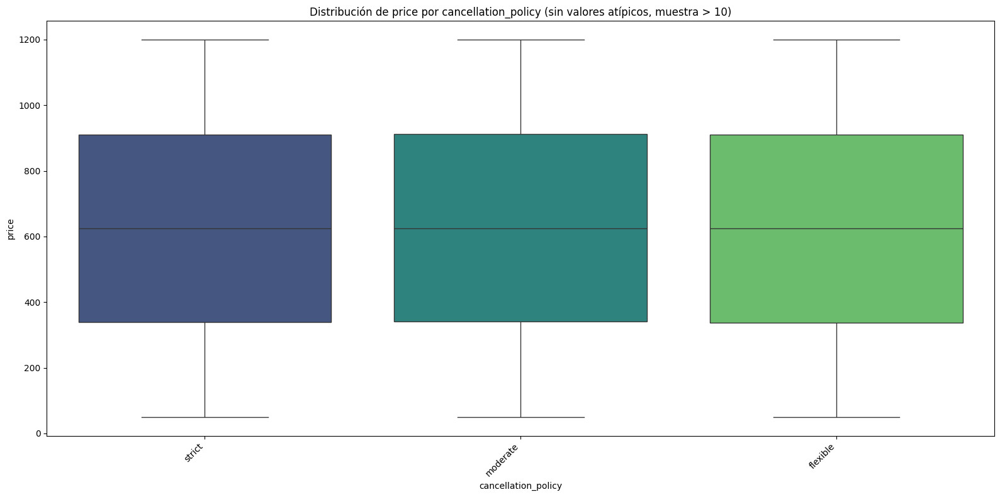

C:\Users\carol\AppData\Local\Temp\ipykernel_47236\994698757.py:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=precios_por_barrio_stat.index, y=precios_por_barrio_stat['median'], palette='viridis')


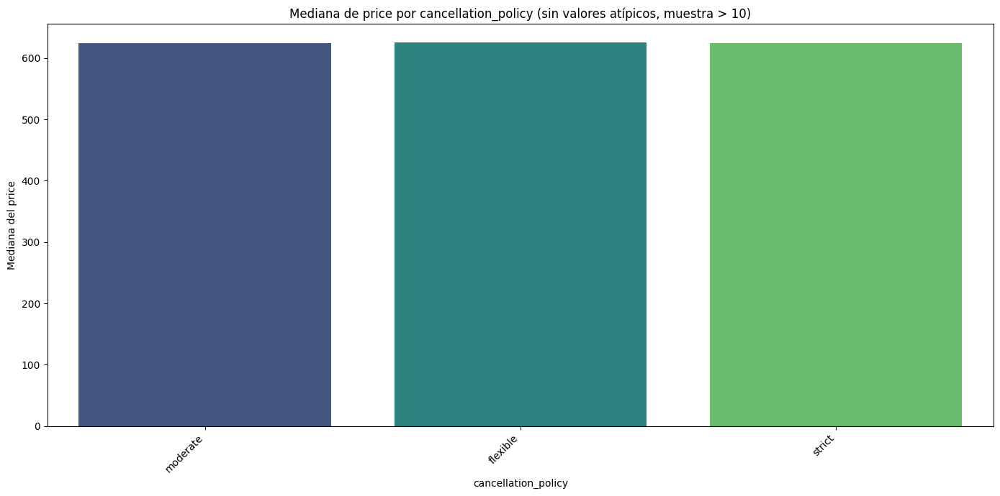

C:\Users\carol\AppData\Local\Temp\ipykernel_47236\994698757.py:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_10_altos.index, y=top_10_altos.values, palette='viridis')


19


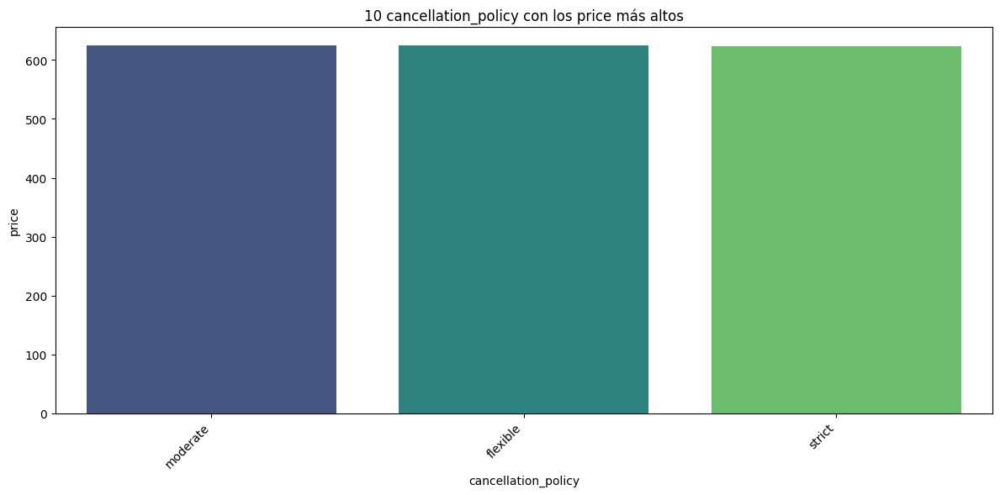

C:\Users\carol\AppData\Local\Temp\ipykernel_47236\994698757.py:84: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_10_bajos.index, y=top_10_bajos.values, palette='viridis')


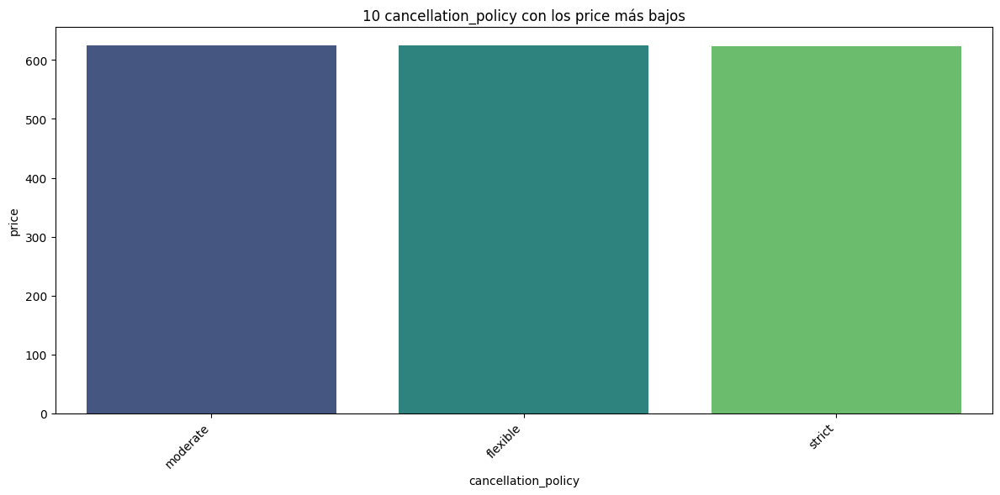

10 cancellation_policy con los price más altos:
cancellation_policy
moderate    625.180105
flexible    625.087839
strict      623.931355
Name: price, dtype: float64

10 cancellation_policy con los price más bajos:
cancellation_policy
moderate    625.180105
flexible    625.087839
strict      623.931355
Name: price, dtype: float64


In [26]:
comparar_valores_barrios(df, 'cancellation_policy', 'price')              

### 1️⃣ Análisis Univariante (Histogramas, Boxplot, Countplot)
Analizamos la distribución de cada variable individualmente.

In [27]:
# Variables numéricas para Histogramas y Boxplots
numerical_columns = df.select_dtypes(exclude=['object', 'category']).columns.to_list() # np.number alternativa
print(numerical_columns)
print(len(numerical_columns))
categorical_columns = df.select_dtypes(include=['object', 'category']).columns.to_list()
print(categorical_columns)
print(len(categorical_columns))

['lat', 'long', 'instant_bookable', 'construction_year', 'price', 'service_fee', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'review_rate_number', 'calculated_host_listings_count', 'availability_365', 'review_year', 'review_month', 'review_day']
15
['host_identity_verified', 'neighbourhood_group', 'neighbourhood', 'cancellation_policy', 'room_type', 'house_rules']
6


<Figure size 1200x600 with 0 Axes>

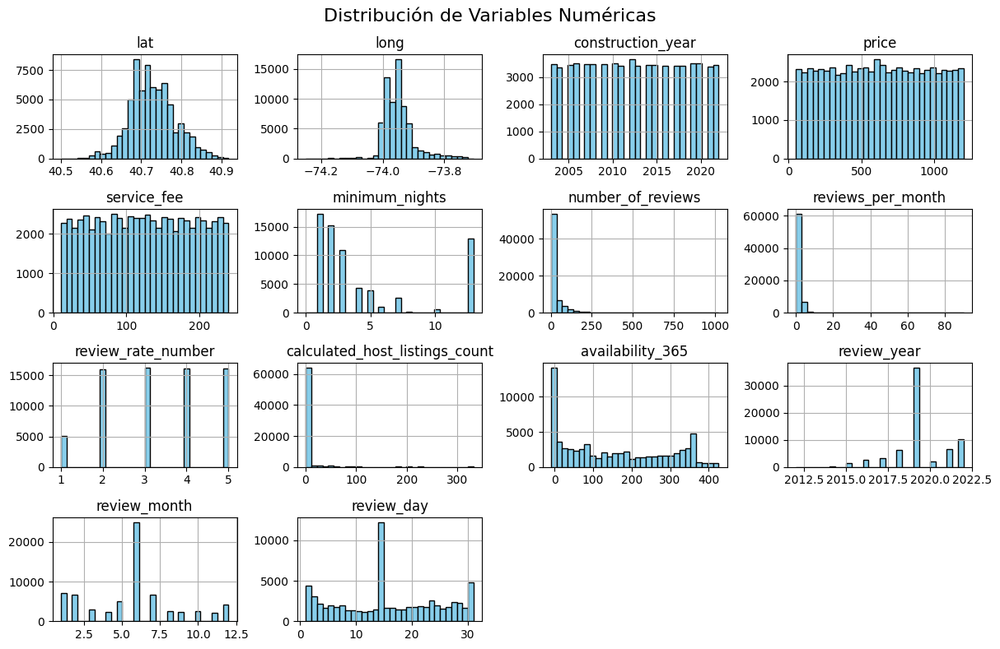

In [28]:
# Histograma para variables numéricas
plt.figure(figsize=(12, 6))
df[numerical_columns].hist(bins=30, figsize=(12, 8), color='skyblue', edgecolor='black')
plt.suptitle("Distribución de Variables Numéricas", fontsize=16)
plt.tight_layout()
plt.show()

<Figure size 1000x600 with 0 Axes>

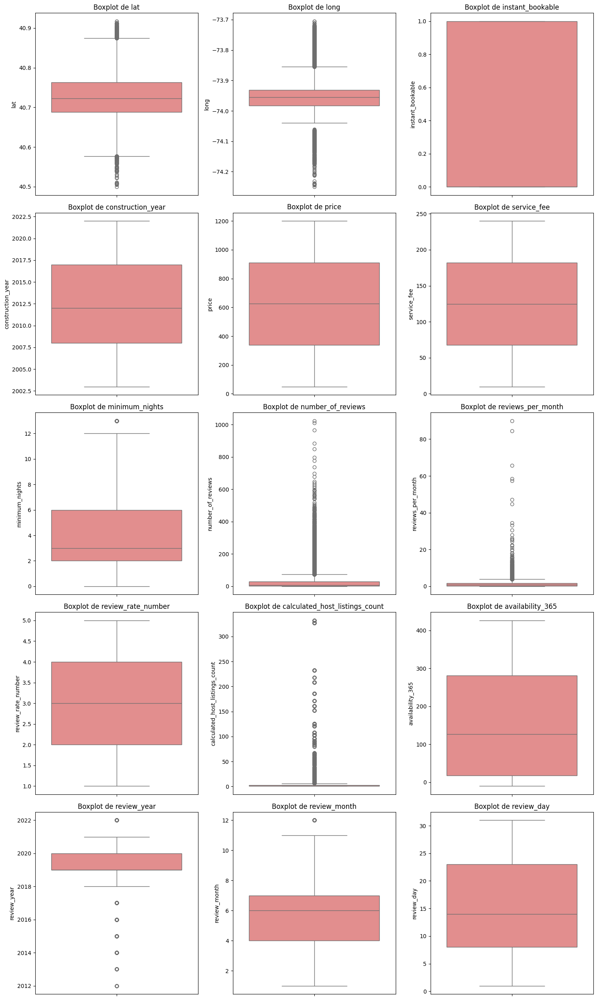

In [29]:
# Boxplots para detectar outliers
import math

plt.figure(figsize=(10,6))

# Definir número de filas y columnas dinámicamente
n_cols = 3  # Número de columnas fijas
n_rows = math.ceil(len(numerical_columns) / n_cols)  # Calcular filas necesarias

# Crear la figura y subgráficos
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))

# Asegurar que 'axes' sea un array unidimensional para iterar sin problemas
axes = axes.flatten()

# Iterar sobre las columnas numéricas y graficar boxplots
for i, col in enumerate(numerical_columns):
    sns.boxplot(y=df[col], color='lightcoral', ax=axes[i])
    axes[i].set_title(f"Boxplot de {col}")

# Eliminar subplots vacíos si hay menos columnas que espacios en la cuadrícula
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()  # Ajustar el diseño para evitar sobreposiciones
plt.show()

In [30]:
print(axes)

[<Axes: title={'center': 'Boxplot de lat'}, ylabel='lat'>
 <Axes: title={'center': 'Boxplot de long'}, ylabel='long'>
 <Axes: title={'center': 'Boxplot de instant_bookable'}, ylabel='instant_bookable'>
 <Axes: title={'center': 'Boxplot de construction_year'}, ylabel='construction_year'>
 <Axes: title={'center': 'Boxplot de price'}, ylabel='price'>
 <Axes: title={'center': 'Boxplot de service_fee'}, ylabel='service_fee'>
 <Axes: title={'center': 'Boxplot de minimum_nights'}, ylabel='minimum_nights'>
 <Axes: title={'center': 'Boxplot de number_of_reviews'}, ylabel='number_of_reviews'>
 <Axes: title={'center': 'Boxplot de reviews_per_month'}, ylabel='reviews_per_month'>
 <Axes: title={'center': 'Boxplot de review_rate_number'}, ylabel='review_rate_number'>
 <Axes: title={'center': 'Boxplot de calculated_host_listings_count'}, ylabel='calculated_host_listings_count'>
 <Axes: title={'center': 'Boxplot de availability_365'}, ylabel='availability_365'>
 <Axes: title={'center': 'Boxplot de rev

In [31]:
print(categorical_columns)

['host_identity_verified', 'neighbourhood_group', 'neighbourhood', 'cancellation_policy', 'room_type', 'house_rules']


In [ ]:
for col in categorical_columns:
    print('________________________________________________________')
    print(f"Valores únicos en la columna '{col}':")
    print('cantidad de valores únicos:', len(df[col].unique()))
    print(f'Los valores únicos de de la columna {col} son:', df[col].unique())
    print()
    print(df[col].unique())
    print(f'usando value_counts: {df[col].value_counts()}')
    print()

________________________________________________________
Valores únicos en la columna 'host_identity_verified':
cantidad de valores únicos: 2
Los valores únicos de de la columna host_identity_verified son: ['unconfirmed' 'verified']

['unconfirmed' 'verified']
usando value_counts: host_identity_verified
unconfirmed    34779
verified       34526
Name: count, dtype: int64

________________________________________________________
Valores únicos en la columna 'neighbourhood_group':
cantidad de valores únicos: 5
Los valores únicos de de la columna neighbourhood_group son: ['Brooklyn' 'Manhattan' 'Queens' 'Staten Island' 'Bronx']

['Brooklyn' 'Manhattan' 'Queens' 'Staten Island' 'Bronx']
usando value_counts: neighbourhood_group
Manhattan        29587
Brooklyn         27895
Queens            9262
Bronx             1912
Staten Island      649
Name: count, dtype: int64

________________________________________________________
Valores únicos en la columna 'neighbourhood':
cantidad de valores úni

### Vale la pena estudiar las categóricas siguientes:

**1. host_identity_verified: ['unconfirmed' 'verified']**

| Categoría    | Conteo |
|--------------|--------|
| unconfirmed  | 34779  |
| verified     | 34526  |

**2. neighbourhood_group: ['Brooklyn' 'Manhattan' 'Queens' 'Staten Island' 'Bronx']**

| Categoría     | Conteo |
|---------------|--------|
| Manhattan     | 29587  |
| Brooklyn      | 27895  |
| Queens        | 9262   |
| Bronx         | 1912   |
| Staten Island | 649    |

**3. cancellation_policy: ['strict' 'moderate' 'flexible']**

| Categoría  | Conteo |
|------------|--------|
| moderate   | 23244  |
| flexible   | 23126  |
| strict     | 22935  |

**4. room_type: ['Private room' 'Entire home/apt' 'Shared room' 'Hotel room']**

| Categoría        | Conteo |
|------------------|--------|
| Entire home/apt  | 37212  |
| Private room     | 30508  |
| Shared room      | 1470   |
| Hotel room       | 115    |

### Ver counplots de categóricas

neighbourhood tiene demasiados valores distintos para hacer el countplot, lo quitamos y usamos:

categorical_columns_util = ['host_identity_verified', 'neighbourhood_group', 'cancellation_policy', 'room_type']

C:\Users\carol\AppData\Local\Temp\ipykernel_47236\762290549.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, palette='pastel', ax=axes[i])
C:\Users\carol\AppData\Local\Temp\ipykernel_47236\762290549.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, palette='pastel', ax=axes[i])
C:\Users\carol\AppData\Local\Temp\ipykernel_47236\762290549.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, palette='pastel', ax=axes[i])
C:\Users\carol\AppData\Local\Temp\ipykernel_47236\762290549.py:1

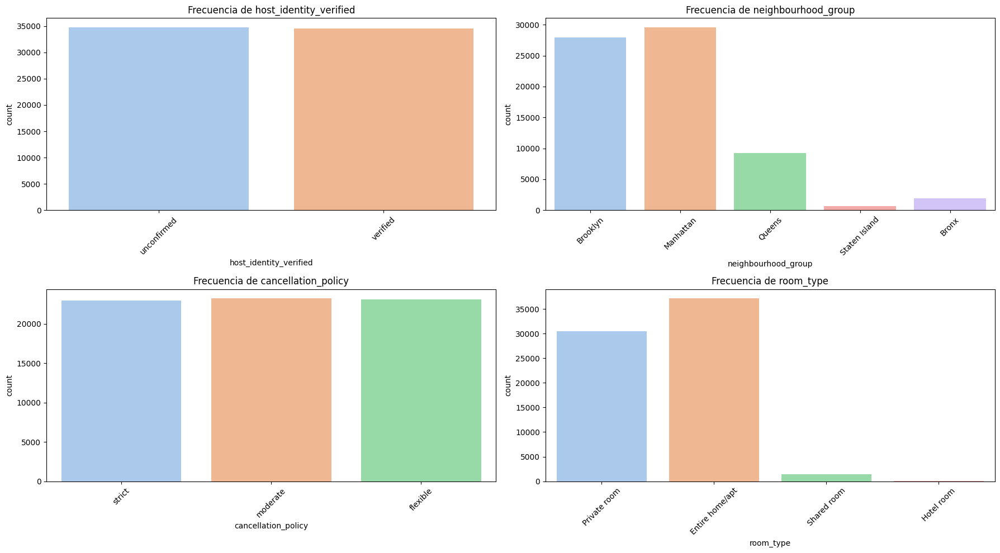

In [33]:
categorical_columns_util = ['host_identity_verified', 'neighbourhood_group', 'cancellation_policy', 'room_type']
n_cols = 2
n_rows = math.ceil(len(categorical_columns_util) / n_cols)  
# Crear figura con subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5 * n_rows))

# Asegurar que los ejes sean 1D para iterar sin problemas
axes = axes.flatten()

# Iterar sobre las columnas categóricas y graficar countplots
for i, col in enumerate(categorical_columns_util):
    sns.countplot(data=df, x=col, palette='pastel', ax=axes[i])
    axes[i].set_title(f"Frecuencia de {col}")
    axes[i].tick_params(axis='x', rotation=45)  # Rotar etiquetas para mejor visibilidad

# Ocultar gráficos vacíos si hay menos columnas que subplots creados
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Ajustar diseño para mejor visibilidad
plt.tight_layout()
plt.show();


Se observa:
* simetría entre verified y unconfiermed en host_identity_verified
* la mayoría de airbnb estan en Brooklyn y Manhattan, algunos en Queens y muy pocos en Staten Island y Bronx
* cancellation_policy con simetría a 3
* room_type: casi todas son o private_room o entire home/apt. muy pocas Shgared room y apenas hay hotel room


Aparece cierta cierta correlacion entre:

* longitud - reviews por mes, review_year, calculated_host_lintings_count
* el año de construccion no correlaciona nada
* el precio tampoco
* numero minimo de noches con - reviews_per_month, calculated_host_listings_count, review_year
* número de reviews con - minimo de noches, reviews_per_month, review_year, review_month (una inversa de la otra)
* reviews_per_month con - review_year, review_month
* calculated_host_lintings_count - availability_365, review_year
* review_year - review_month


#### Basándonos en estas correlaciones, podemos realizar varios tipos de análisis para obtener información más profunda sobre las relaciones entre estas variables. Algunas ideas:

**1. Análisis de dispersión (Scatter Plots):**

* **Visualizar las relaciones:**
    * Crea gráficos de dispersión para visualizar las relaciones entre las variables que has identificado como correlacionadas.
    * Por ejemplo, grafica "longitud" vs. "reviews por mes", "mínimo de noches" vs. "reviews_per_month", etc.
    * Esto te permitirá observar visualmente la fuerza y la dirección de las correlaciones.
* **Identificar patrones no lineales:**
    * Los gráficos de dispersión pueden revelar patrones no lineales que no se capturan con la correlación lineal.
    * Por ejemplo, podrías observar una relación cuadrática o exponencial.
* **Detectar valores atípicos:**
    * Los gráficos de dispersión pueden ayudarte a identificar valores atípicos que podrían estar afectando las correlaciones.

**2. Análisis de regresión:**

* **Cuantificar las relaciones:**
    * Realiza análisis de regresión lineal para cuantificar las relaciones entre las variables.
    * Por ejemplo, puedes realizar una regresión lineal de "reviews_per_month" en "review_year" y "review_month".
    * Esto te permitirá obtener los coeficientes de regresión, que indican la fuerza y la dirección de las relaciones.
* **Predecir variables:**
    * Utiliza los modelos de regresión para predecir una variable en función de otras.
    * Por ejemplo, puedes predecir "reviews_per_month" en función de "review_year" y "review_month".
* **Regresión no lineal:**
    * Si observas patrones no lineales en los gráficos de dispersión, considera utilizar modelos de regresión no lineal.

**3. Análisis de series temporales:**

* **Tendencias y estacionalidad:**
    * Si tienes datos de series temporales (por ejemplo, "reviews_per_month" a lo largo del tiempo), realiza análisis de series temporales para identificar tendencias y patrones estacionales.
    * Puedes utilizar técnicas como la descomposición de series temporales o modelos ARIMA.
* **Análisis de rezagos:**
    * Investiga si hay rezagos en las relaciones entre las variables.
    * Por ejemplo, ¿"review_month" afecta a "reviews_per_month" con un rezago de un mes?

**4. Análisis de agrupamiento (Clustering):**

* **Segmentar datos:**
    * Utiliza técnicas de agrupamiento (como k-means) para segmentar los datos en grupos basados en las variables correlacionadas.
    * Por ejemplo, podrías agrupar los datos según "longitud", "reviews_per_month" y "calculated_host_listings_count".
    * Esto te permitirá identificar grupos de datos con características similares.
* **Analizar grupos:**
    * Analiza las características de cada grupo para obtener información sobre las relaciones entre las variables.

**5. Análisis de variables categóricas:**

* **Tablas de contingencia:**
    * Si tienes variables categóricas (por ejemplo, "review_month"), crea tablas de contingencia para analizar las relaciones con las variables numéricas.
    * Por ejemplo, puedes crear una tabla de contingencia de "review_month" vs. "reviews_per_month".
* **Pruebas de chi-cuadrado:**
    * Realiza pruebas de chi-cuadrado para determinar si hay una asociación estadísticamente significativa entre las variables categóricas y numéricas.

**6. Análisis de valores atípicos:**

* **Identificar y analizar valores atípicos:**
    * Utiliza técnicas de detección de valores atípicos para identificar y analizar los valores atípicos en las variables correlacionadas.
    * Los valores atípicos podrían estar afectando las correlaciones o revelar información importante sobre los datos.

**7. Análisis de correlación más profundo:**

* **Correlación parcial:**
    * Calcula la correlación parcial para eliminar el efecto de variables de confusión.
    * Por ejemplo, puedes calcular la correlación parcial entre "mínimo de noches" y "reviews_per_month" controlando por "calculated_host_listings_count".
* **Correlación no lineal:**
    * Utiliza técnicas de correlación no lineal (como la correlación de Spearman) para capturar relaciones no lineales.



#### Aquí tienes el código para cada uno de los análisis que mencioné anteriormente, adaptado para tu conjunto de datos:

**1. Análisis de dispersión (Scatter Plots):**


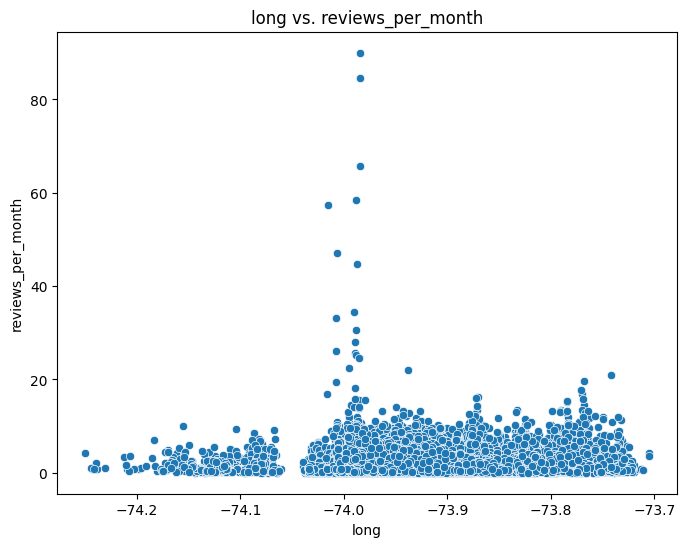

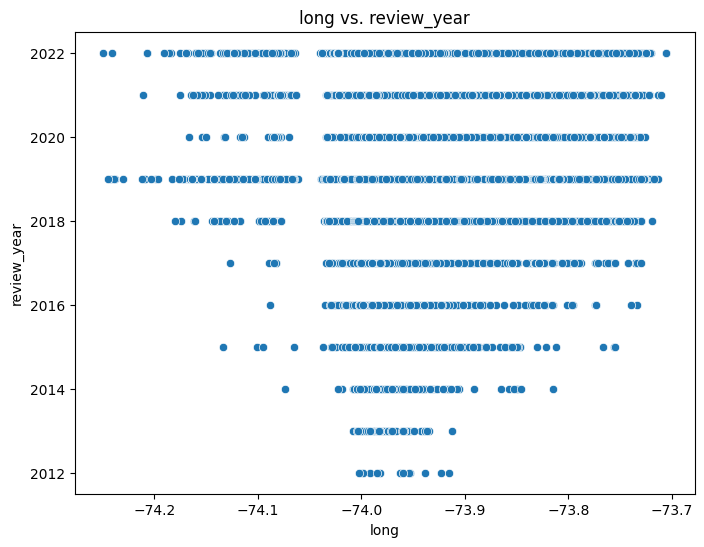

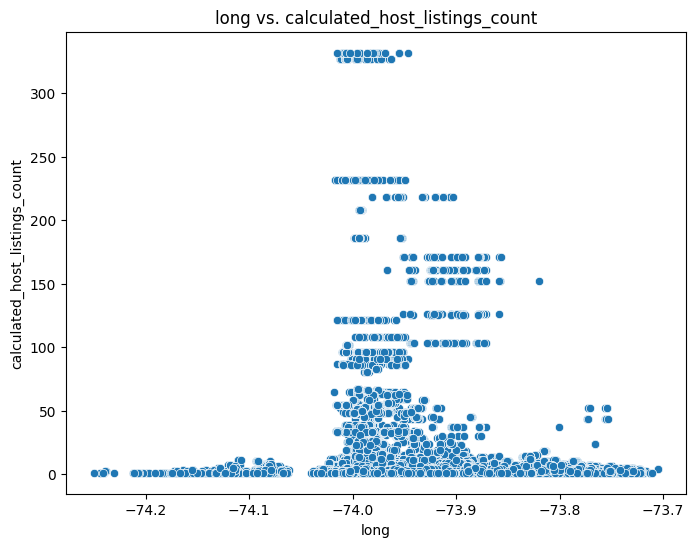

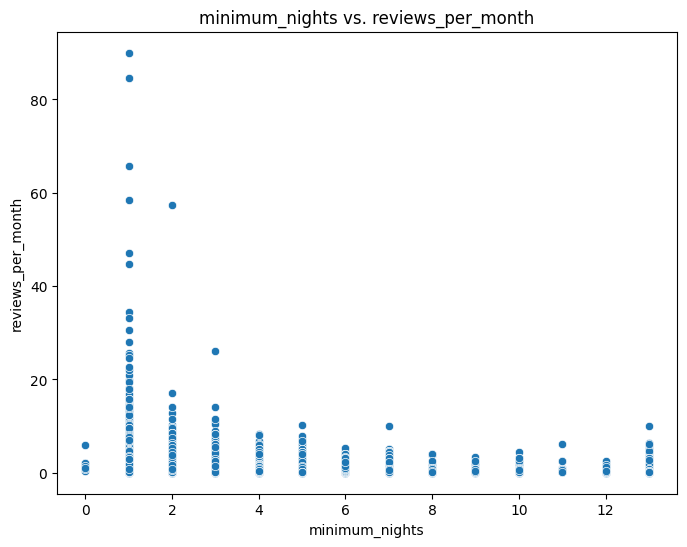

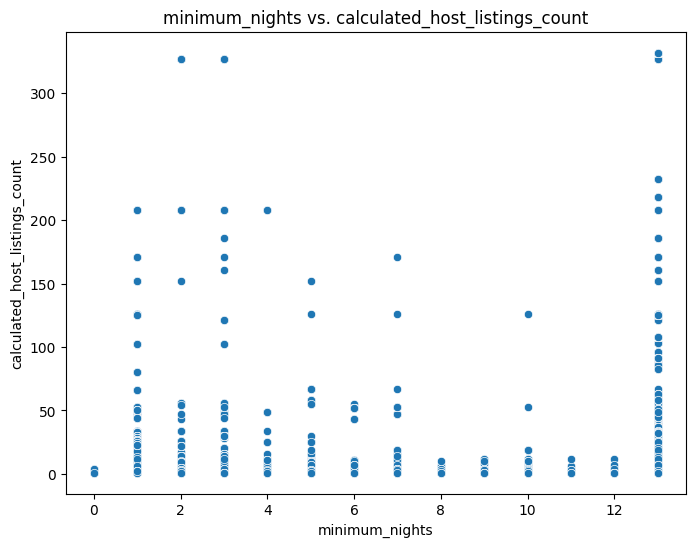

...

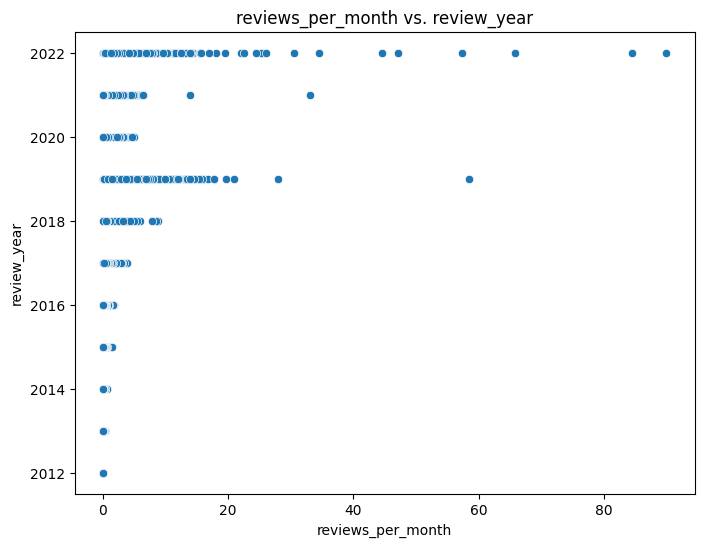

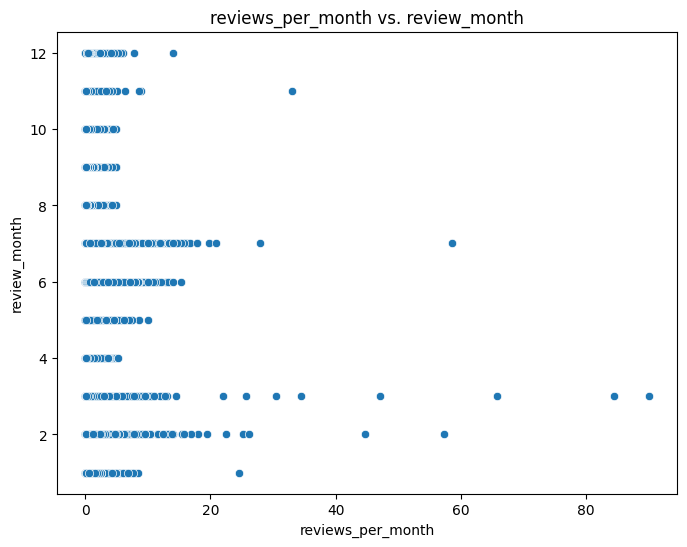

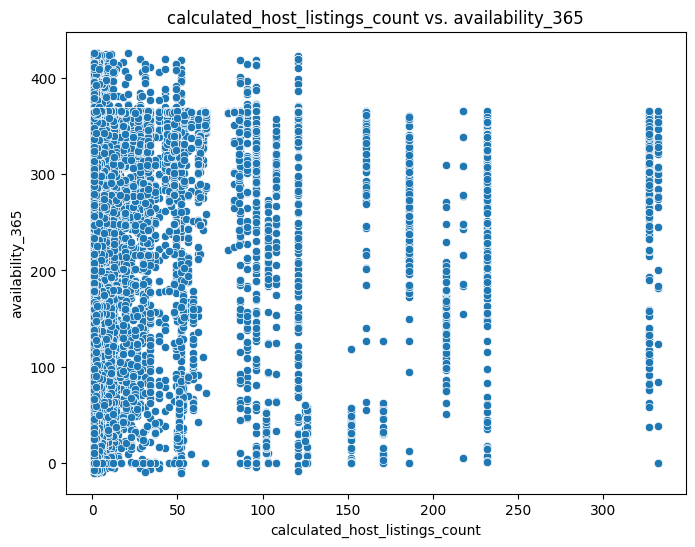

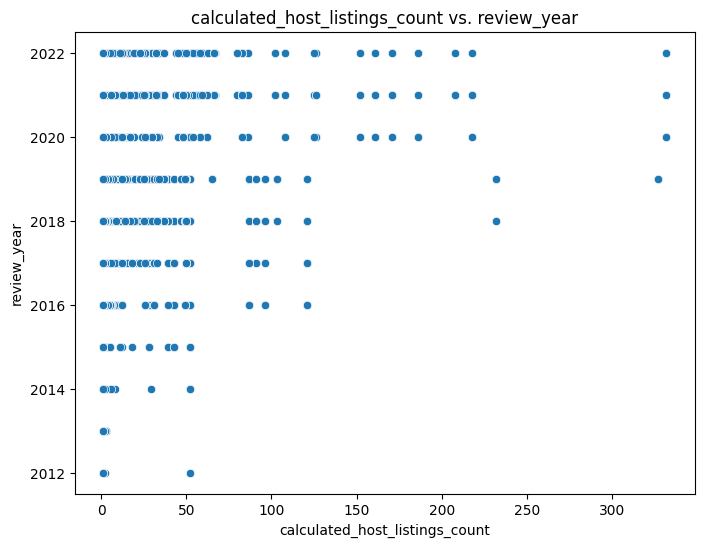

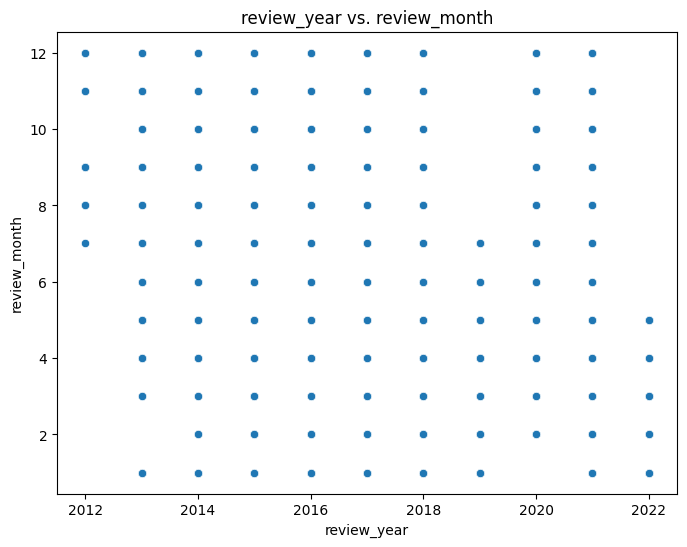

In [34]:
# Variables a analizar
variables = [
    ("long", "reviews_per_month"),
    ("long", "review_year"),
    ("long", "calculated_host_listings_count"),
    ("minimum_nights", "reviews_per_month"),
    ("minimum_nights", "calculated_host_listings_count"),
    ("minimum_nights", "review_year"),
    ("number_of_reviews", "minimum_nights"),
    ("number_of_reviews", "reviews_per_month"),
    ("number_of_reviews", "review_year"),
    ("number_of_reviews", "review_month"),
    ("reviews_per_month", "review_year"),
    ("reviews_per_month", "review_month"),
    ("calculated_host_listings_count", "availability_365"),
    ("calculated_host_listings_count", "review_year"),
    ("review_year", "review_month")
]

# Crear gráficos de dispersión
for var1, var2 in variables:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=var1, y=var2, data=df)
    plt.title(f"{var1} vs. {var2}")
    plt.show()

**2. Análisis de regresión:**

In [35]:
import statsmodels.api as sm

# Variables a analizar
variables = [
    ("reviews_per_month", ["review_year", "review_month"]),
    ("calculated_host_listings_count", ["availability_365", "review_year"])
]

# Realizar análisis de regresión
for target, predictors in variables:
    X = df[predictors]
    y = df[target]
    X = sm.add_constant(X)  # Agregar constante para el intercepto
    model = sm.OLS(y, X).fit()
    print(f"Regresión: {target} ~ {predictors}")
    print(model.summary())

Regresión: reviews_per_month ~ ['review_year', 'review_month']
                            OLS Regression Results                            
Dep. Variable:      reviews_per_month   R-squared:                       0.059
Model:                            OLS   Adj. R-squared:                  0.059
Method:                 Least Squares   F-statistic:                     2175.
Date:                Wed, 26 Feb 2025   Prob (F-statistic):               0.00
Time:                        21:08:05   Log-Likelihood:            -1.3132e+05
No. Observations:               69305   AIC:                         2.626e+05
Df Residuals:                   69302   BIC:                         2.627e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------

**5. Análisis de variables categóricas:**

In [36]:
from scipy.stats import chi2_contingency

# Tabla de contingencia (ejemplo: review_month vs. reviews_per_month)
contingency_table = pd.crosstab(df['review_month'], pd.cut(df['reviews_per_month'], bins=5))
print("Tabla de contingencia:")
print(contingency_table)

# Prueba de chi-cuadrado
chi2, p, _, _ = chi2_contingency(contingency_table)
print(f"Chi-cuadrado: {chi2}, p-valor: {p}")


Tabla de contingencia:
reviews_per_month  (-0.08, 18.008]  (18.008, 36.006]  (36.006, 54.004]  \
review_month                                                             
1                             7047                 1                 0   
2                             6630                 5                 1   
3                             2848                 4                 1   
4                             2405                 0                 0   
5                             5070                 0                 0   
6                            24955                 0                 0   
7                             6609                 3                 0   
8                             2462                 0                 0   
9                             2328                 0                 0   
10                            2528                 0                 0   
11                            2204                 1                 0   
12             

**6. Análisis de valores atípicos:**

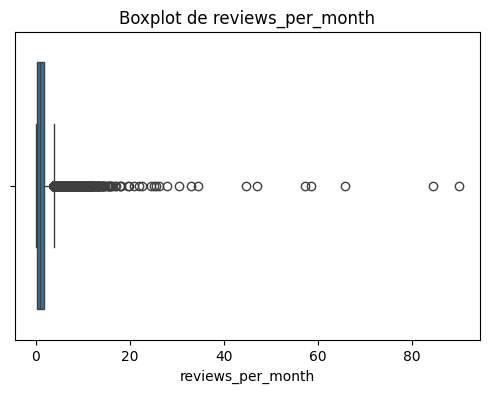

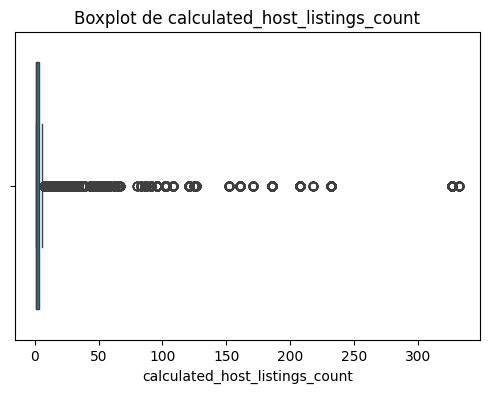

In [37]:
# Variables a analizar
variables_outliers = ["reviews_per_month", "calculated_host_listings_count"]

# Boxplots para detectar valores atípicos
for var in variables_outliers:
    plt.figure(figsize=(6, 4))
    sns.boxplot(x=df[var])
    plt.title(f"Boxplot de {var}")
    plt.show()

**7. Análisis de correlación más profundo:**

In [ ]:
import pandas as pd
import statsmodels.api as sm

def partial_correlation(data, x, y, covar):
    """
    Calcula la correlación parcial entre x e y, controlando por covar.

    Args:
        data (pd.DataFrame): DataFrame que contiene las variables.
        x (str): Nombre de la variable x.
        y (str): Nombre de la variable y.
        covar (str): Nombre de la variable de control.

    Returns:
        float: Correlación parcial.
    """

    # Regresión de x en covar
    model_x = sm.OLS(data[x], sm.add_constant(data[covar])).fit()
    resid_x = model_x.resid

    # Regresión de y en covar
    model_y = sm.OLS(data[y], sm.add_constant(data[covar])).fit()
    resid_y = model_y.resid

    # Correlación entre los residuos
    partial_corr = resid_x.corr(resid_y)

    return partial_corr

partial_corr = partial_correlation(df, "minimum_nights", "reviews_per_month", "calculated_host_listings_count")
print(f"Correlación parcial: {partial_corr}")

Correlación parcial: -0.2717330962759482


In [ ]:
# Correlación no lineal (ejemplo: correlación de Spearman)
spearman_corr = df[["minimum_nights", "reviews_per_month"]].corr(method="spearman")
print("Correlación de Spearman:")
print(spearman_corr)

Correlación de Spearman:
                   minimum_nights  reviews_per_month
minimum_nights           1.000000          -0.314183
reviews_per_month       -0.314183           1.000000


In [40]:
df['neighbourhood'].describe

<bound method NDFrame.describe of 0               Kensington
1                  Midtown
2                   Harlem
3             Clinton_Hill
4              East_Harlem
               ...        
69300             Bushwick
69301         Williamsburg
69302      Upper_West_Side
69303        Hells_Kitchen
69304    BedfordStuyvesant
Name: neighbourhood, Length: 69305, dtype: object>

In [41]:
'''# hice esta celda para ver figuras, pero la comento porque salen más de 6.000

numerical_cols = ['lat', 'long', 'instant_bookable', 'construction_year', 'price', 'service_fee', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'review_rate_number', 'calculated_host_listings_count', 'availability_365', 'review_year', 'review_month', 'review_day']
categorical_cols = ['host_identity_verified', 'neighbourhood_group', 'neighbourhood', 'cancellation_policy', 'room_type']

all_cols = numerical_cols + categorical_cols

for col1 in all_cols:
    for col2 in all_cols:
        if col1 != col2:
            for hue_col in all_cols:
                if hue_col != col1 and hue_col != col2:
                    try:
                        if hue_col in categorical_cols and len(df[hue_col].unique()) > 20:
                            print(f"Aviso: Se omitió el plot para {col1} vs {col2} porque {hue_col} tiene más de 20 valores únicos.")
                            continue

                        plt.figure(figsize=(12, 8))

                        hue_values = df[hue_col].unique()
                        if len(hue_values) > 10 and hue_col in numerical_cols:
                            binned_col_name = f'{hue_col}_binned'
                            df[binned_col_name] = pd.qcut(df[hue_col], q=10, duplicates='drop')
                            hue_col_to_use = binned_col_name
                        else:
                            hue_col_to_use = hue_col
                            binned_col_name = hue_col

                        if col1 in numerical_cols and col2 in numerical_cols:
                            sns.scatterplot(data=df, x=col1, y=col2, hue=hue_col_to_use, palette='viridis', s=15) 
                            plt.title(f"Relación entre {col1} y {col2} por {hue_col_to_use}")
                            plt.xlabel(col1)
                            plt.ylabel(col2)
                        elif col1 in numerical_cols and col2 in categorical_cols:
                            sns.boxplot(data=df, x=col2, y=col1, hue=hue_col_to_use, palette='viridis')  
                            plt.title(f"Relación entre {col1} y {col2} por {hue_col_to_use}")
                            plt.xlabel(col2)
                            plt.ylabel(col1)
                        elif col1 in categorical_cols and col2 in numerical_cols:
                            sns.boxplot(data=df, x=col1, y=col2, hue=hue_col_to_use, palette='viridis') 
                            plt.title(f"Relación entre {col1} y {col2} por {hue_col_to_use}")
                            plt.xlabel(col1)
                            plt.ylabel(col2)
                        else:
                            contingency_table = pd.crosstab(df[col1], df[col2])
                            sns.heatmap(contingency_table, annot=True, cmap="viridis")  
                            plt.title(f"Relación entre {col1} y {col2}")
                            plt.xlabel(col2)
                            plt.ylabel(col1)

                        plt.xticks(rotation=45, ha='right')
                        plt.tight_layout()

                        plt.legend(title=hue_col_to_use, bbox_to_anchor=(1.05, 1), loc='upper left')
                        plt.savefig(f"{col1}_vs_{col2}_hue_{binned_col_name}.png", bbox_inches='tight')

                        plt.show()

                        print(f"Plot generado: {col1} vs {col2} (hue = {hue_col_to_use})")

                    except Exception as e:
                        print(f"Error al generar el plot para {col1} vs {col2} (hue = {hue_col}): {e}")

                    if f'{hue_col}_binned' in df.columns:
                        df.drop(f'{hue_col}_binned', axis=1, inplace=True)'''

'# hice esta celda para ver figuras, pero la comento porque salen más de 6.000\n\nnumerical_cols = [\'lat\', \'long\', \'instant_bookable\', \'construction_year\', \'price\', \'service_fee\', \'minimum_nights\', \'number_of_reviews\', \'reviews_per_month\', \'review_rate_number\', \'calculated_host_listings_count\', \'availability_365\', \'review_year\', \'review_month\', \'review_day\']\ncategorical_cols = [\'host_identity_verified\', \'neighbourhood_group\', \'neighbourhood\', \'cancellation_policy\', \'room_type\']\n\nall_cols = numerical_cols + categorical_cols\n\nfor col1 in all_cols:\n    for col2 in all_cols:\n        if col1 != col2:\n            for hue_col in all_cols:\n                if hue_col != col1 and hue_col != col2:\n                    try:\n                        if hue_col in categorical_cols and len(df[hue_col].unique()) > 20:\n                            print(f"Aviso: Se omitió el plot para {col1} vs {col2} porque {hue_col} tiene más de 20 valores únicos.")\n 

cierta simetría entre verified y unconfiermed en host_identity_verified

la mayoría de airbnb estan en Brooklyn y Manhattan, algunos en Queens y muy pocos en Staten Island y Bron

cancellation_policy con simetría a 3

room_type: casi todas son o private_room o entire home/apt. muy pocas Shgared room y apenas hay hotel room


In [42]:
'''import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import MinMaxScaler  # Importa MinMaxScaler para escalar

# ... (tu DataFrame df) ...

numerical_cols = ['lat', 'long', 'instant_bookable', 'construction_year', 'price', 'service_fee', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'review_rate_number', 'calculated_host_listings_count', 'availability_365', 'review_year', 'review_month', 'review_day']
categorical_cols = ['host_identity_verified', 'neighbourhood_group', 'neighbourhood', 'cancellation_policy', 'room_type', 'house_rules']

all_cols = numerical_cols + categorical_cols

for col1 in all_cols:
    for col2 in all_cols:
        if col1 != col2:  # Evitar comparar una columna consigo misma
            for hue_col in all_cols:  # Nuevo bucle para el argumento hue
                if hue_col != col1 and hue_col != col2:  # Evitar usar la misma columna para hue
                    try:
                        plt.figure(figsize=(10, 6))

                        if col1 in numerical_cols and col2 in numerical_cols:
                            # Elegir la tercera variable para el tamaño de los puntos
                            size_col = 'number_of_reviews'  # Puedes cambiar esta columna

                            # Escalar los valores de la tercera variable
                            scaler = MinMaxScaler(feature_range=(10, 1000))  # Rango de tamaños: 10 a 1000
                            sizes = scaler.fit_transform(df[[size_col]])  # Ajusta y transforma los datos

                            sns.scatterplot(data=df, x=col1, y=col2, hue=hue_col, size=sizes.flatten(), sizes=(1, 10), palette='pastel', alpha=0.5 )  # Nuevo argumento 'size'
                            plt.title(f"Relación entre {col1} y {col2} por {hue_col} (tamaño por {size_col})")
                            plt.xlabel(col1)
                            plt.ylabel(col2)

                        # ... (resto del código igual)

                        plt.xticks(rotation=45, ha='right')
                        plt.tight_layout()
                        plt.show()

                        print(f"Plot generado: {col1} vs {col2} (hue = {hue_col})")  # Mensaje de progreso

                    except Exception as e:
                        print(f"Error al generar el plot para {col1} vs {col2} (hue = {hue_col}): {e}")'''

'import seaborn as sns\nimport matplotlib.pyplot as plt\nimport pandas as pd\nfrom sklearn.preprocessing import MinMaxScaler  # Importa MinMaxScaler para escalar\n\n# ... (tu DataFrame df) ...\n\nnumerical_cols = [\'lat\', \'long\', \'instant_bookable\', \'construction_year\', \'price\', \'service_fee\', \'minimum_nights\', \'number_of_reviews\', \'reviews_per_month\', \'review_rate_number\', \'calculated_host_listings_count\', \'availability_365\', \'review_year\', \'review_month\', \'review_day\']\ncategorical_cols = [\'host_identity_verified\', \'neighbourhood_group\', \'neighbourhood\', \'cancellation_policy\', \'room_type\', \'house_rules\']\n\nall_cols = numerical_cols + categorical_cols\n\nfor col1 in all_cols:\n    for col2 in all_cols:\n        if col1 != col2:  # Evitar comparar una columna consigo misma\n            for hue_col in all_cols:  # Nuevo bucle para el argumento hue\n                if hue_col != col1 and hue_col != col2:  # Evitar usar la misma columna para hue\n

In [43]:
print(len(numerical_columns))

15


In [44]:
# Cuartiles e IQR
def cuartiles_iqr(dataframe, columna):
    # Cálculo de Q1, Q3 e IQR
    Q1 = np.percentile(dataframe[columna], 25)  # Primer cuartil
    Q2 = np.percentile(dataframe[columna], 50)  # Segundo cuartil == mediana
    Q3 = np.percentile(dataframe[columna], 75)  # Tercer cuartil
    IQR = Q3 - Q1 # Rango intercuartílico
    print("Cuartiles e IQR:")
    print(f"Q1: {Q1}, Q2 (mediana): {Q2}, Q3: {Q3}")
    print(f"IQR: {IQR}")
    return Q1, Q2, Q3, IQR

Q1, Q2, Q3, IQR = cuartiles_iqr(df, 'price')
print("------------------------------------------------")

Cuartiles e IQR:
Q1: 339.0, Q2 (mediana): 624.7360700839849, Q3: 911.0
IQR: 572.0
------------------------------------------------


In [45]:
# Filtrar por porcentaje
def filtrar_por_porcentaje(dataframe, columna):
    sorted_values = np.sort(dataframe[columna])   # Ordenar los valores de la columna
    # Calcular los percentiles
    bottom_20_percent = np.percentile(sorted_values, 20)
    top_20_percent = np.percentile(sorted_values, 80)
    
    # Filtrar precios según los percentiles
    bottom_prices = dataframe[dataframe[columna]<= bottom_20_percent]
    top_prices = dataframe[dataframe[columna] >= top_20_percent]

    # Imprimir resultados
    print(f"Filtrar columna {columna} por porcentaje:")
    print(f"Percentil 20: {bottom_20_percent:.2f}")
    print(f"Percentil 80: {top_20_percent:.2f}")
    print(f"Cantidad en el 20% más barato: {len(bottom_prices)}")
    print(f"Cantidad en el 20% más caro: {len(top_prices)}")
   
    return top_prices, bottom_prices, top_20_percent, bottom_20_percent

# Llamar a la función con el DataFrame y la columna 'price'
top_prices, bottom_prices, top_20_percent, bottom_20_percent = filtrar_por_porcentaje(df, 'price')
print("------------------------------------------------")

Filtrar columna price por porcentaje:
Percentil 20: 281.00
Percentil 80: 969.00
Cantidad en el 20% más barato: 13914
Cantidad en el 20% más caro: 13874
------------------------------------------------


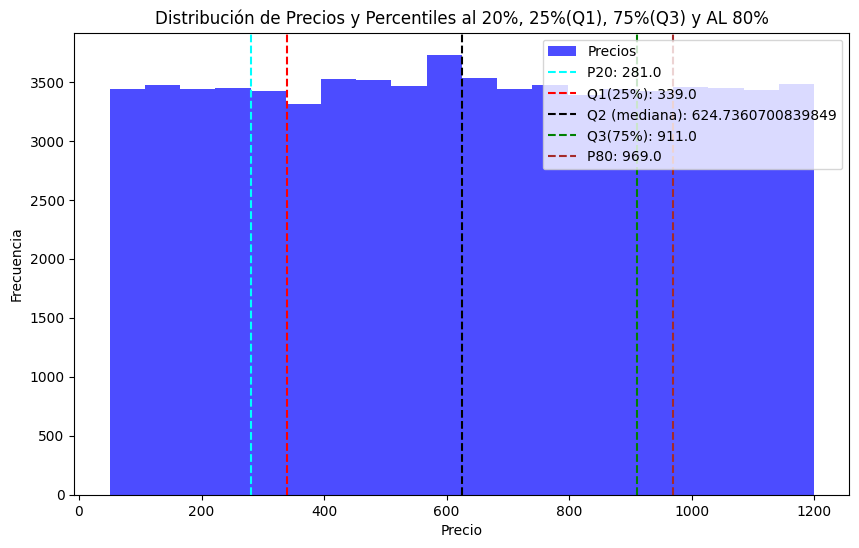

In [46]:
# histograma para visualizar los datos y marcar los percentiles:
plt.figure(figsize=(10, 6))
plt.hist(df['price'], bins=20, color='blue', alpha=0.7, label='Precios')
plt.axvline(bottom_20_percent, color='cyan', linestyle='--', label=f'P20: {bottom_20_percent}')
plt.axvline(Q1, color='red', linestyle='--', label=f'Q1(25%): {Q1}')
plt.axvline(Q2, color='black', linestyle='--', label=f'Q2 (mediana): {Q2}')
plt.axvline(Q3, color='green', linestyle='--', label=f'Q3(75%): {Q3}')
plt.axvline(top_20_percent, color='brown', linestyle='--', label=f'P80: {top_20_percent}')
plt.title("Distribución de Precios y Percentiles al 20%, 25%(Q1), 75%(Q3) y AL 80%")
plt.xlabel("Precio")
plt.ylabel("Frecuencia")
plt.legend()
plt.show()

In [47]:
# Varianza y desviación estándar
def varianza_desviacion(columna):
    variance = np.var(columna)
    std_dev = np.std(columna)
    print(f"Varianza: {variance:.2f}, Desviación estándar: {std_dev:.2f}")
    return variance, std_dev

# Llamar a la función con la columna 'price'
variance, std_dev = varianza_desviacion(df['price'])
print("------------------------------------------------")

Varianza: 109664.66, Desviación estándar: 331.16
------------------------------------------------


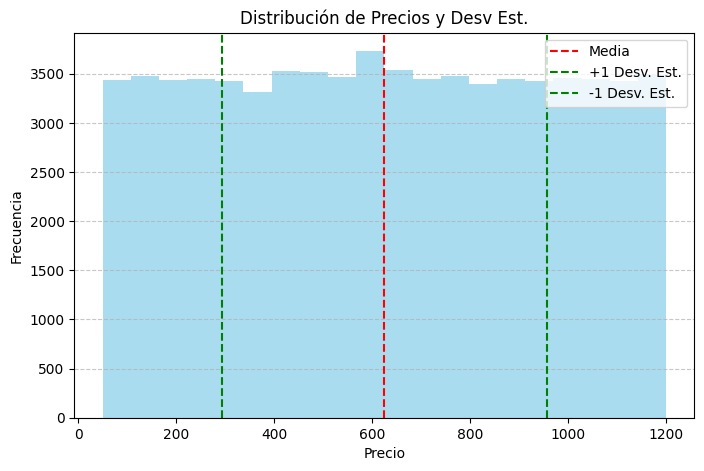

In [48]:
# histograma o boxplot para visualizar la dispersión de los datos:
plt.figure(figsize=(8, 5))
plt.hist(df['price'], bins=20, color='skyblue', alpha=0.7)
plt.axvline(df['price'].mean(), color='red', linestyle='--', label='Media')
plt.axvline(df['price'].mean() + std_dev, color='green', linestyle='--', label='+1 Desv. Est.')
plt.axvline(df['price'].mean() - std_dev, color='green', linestyle='--', label='-1 Desv. Est.')
plt.title("Distribución de Precios y Desv Est.")

plt.xlabel('Precio')
plt.ylabel('Frecuencia')
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Transformando distribución de la columna 'price'


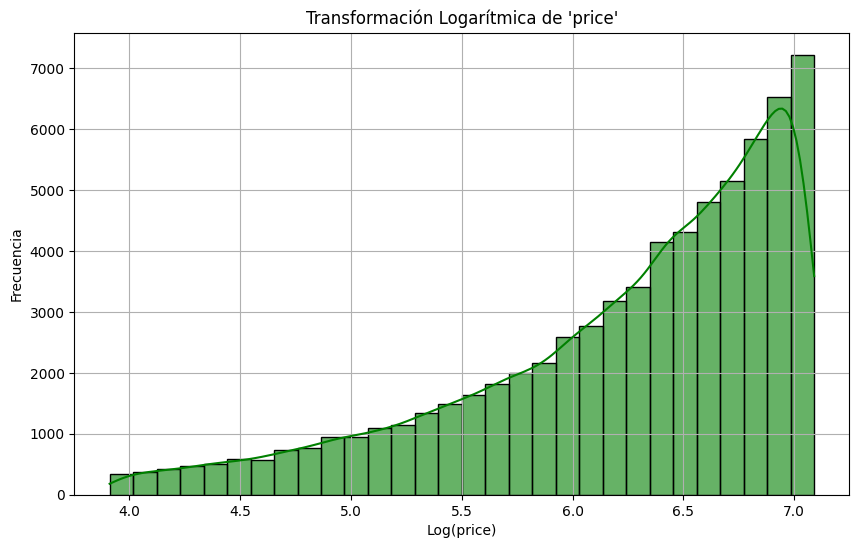

------------------------------------------------


In [49]:
# Transformar distribuciones
def transformar_distribuciones(dataframe, columna):
    print(f"Transformando distribución de la columna '{columna}'")
    # Filtrar valores positivos (aunque sepamos que todos los precios lo son)
    valores_positivos = dataframe[columna][dataframe[columna] > 0]
    
    # Aplicar transformación logarítmica
    log_transformation = np.log(valores_positivos)
    
    # Gráfico de la distribución transformada
    plt.figure(figsize=(10, 6))
    sns.histplot(log_transformation, kde=True, bins=30, color="green", alpha=0.6)
    plt.title(f"Transformación Logarítmica de '{columna}'")
    plt.xlabel(f"Log({columna})")
    plt.ylabel("Frecuencia")
    plt.grid()
    plt.show()
    
    # Retornar la transformación
    return log_transformation

# Llamar a la función con la columna 'price'
price_log = transformar_distribuciones(df, 'price')
print("------------------------------------------------")

# Mostrar los datos transformados
#print("Valores transformados (log):")
#print(price_log)

Tenemos las columnas numéricas en el dataframe: ['lat', 'long', 'instant_bookable', 'construction_year', 'price', 'service_fee', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'review_rate_number', 'calculated_host_listings_count', 'availability_365', 'review_year', 'review_month', 'review_day']
Tenemos 15 columnas numéricas
número de columnas del plot: 3
5
número de filas del plot: 5


C:\Users\carol\AppData\Local\Temp\ipykernel_47236\612411198.py:46: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


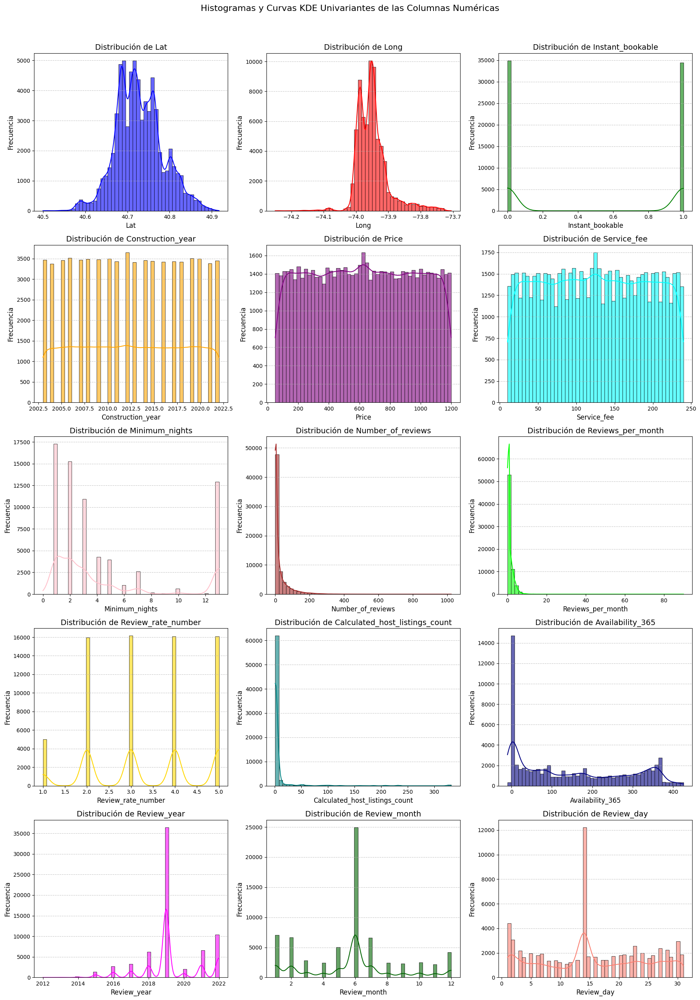

In [50]:
# Seleccionar las columnas numéricas del DataFrame
#numerical_columns = df.select_dtypes(include=['float', 'int']).columns
print(f'Tenemos las columnas numéricas en el dataframe: {numerical_columns}')
print(f'Tenemos {len(numerical_columns)} columnas numéricas')

# Filtrar las columnas con más de 3 valores únicos, para no imprimir la columna del IVA, ni las de los descuentos
#numerical_columns = [col for col in numerical_columns if df[col].nunique() > 3]
#print(f'Tenemos {len(numerical_columns)} columnas numéricas con más de un valor único')

# Configurar la figura para varios subplots
n_cols = 3  # Número de columnas por fila
print(f'número de columnas del plot: {n_cols}')
n_rows = (len(numerical_columns) + n_cols - 1) // n_cols  # Calcular el número de filas necesario
print(n_rows)
print(f'número de filas del plot: {n_rows}')

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5 * n_rows), constrained_layout=True)
axes = axes.flatten()  # Aplanar el arreglo de ejes
# Lista de colores
colores = [
    "blue", "red", "green", "orange", "purple", "cyan", 
    "pink", "brown", "lime", "gold", "teal", "navy", 
    "magenta", "darkgreen", "salmon"
]
# Iterar sobre las columnas numéricas y generar los histogramas
for i, column in enumerate(numerical_columns):  
    ax = axes[i]  # Subplot correspondiente
    # Rango de valores para ajustar el ancho
    col_min, col_max = df[column].min(), df[column].max()
    bins = np.linspace(col_min, col_max, 50)  # Crear bins uniformemente distribuidos
    #print(f'El eje x del histograma de {column} va desde {col_min} hasta  {col_max}')
    # Usar colores de la lista (repetir si se acaban los colores)
    color = colores[i % len(colores)]  # Asignar color
    sns.histplot(data=df, x=column, bins=bins, kde=True, color=color, alpha=0.6, ax=ax)
    ax.set_title(f"Distribución de {column.capitalize()}", fontsize=14)
    ax.set_xlabel(column.capitalize(), fontsize=12)
    ax.set_ylabel("Frecuencia", fontsize=12)
    ax.grid(axis='y', linestyle='--', alpha=0.7)

# Ocultar subplots adicionales si sobran
for j in range(len(numerical_columns), len(axes)):
    fig.delaxes(axes[j])

# Ajustar el diseño
plt.suptitle("Histogramas y Curvas KDE Univariantes de las Columnas Numéricas", fontsize=16, y=1.02)
plt.tight_layout()
plt.show()

Destacan las reviews:

 de junio de todos los años

2019

14 del mes

Columnas categóricas útiles: ['host_identity_verified', 'neighbourhood_group', 'cancellation_policy', 'room_type']
Total de columnas categóricas útiles: 4
Total de combinaciones generadas: 24
Generando gráficos para host_identity_verified...
Gráfico guardado como: boxplot_host_identity_verified.png


C:\Users\carol\AppData\Local\Temp\ipykernel_47236\1590444687.py:58: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


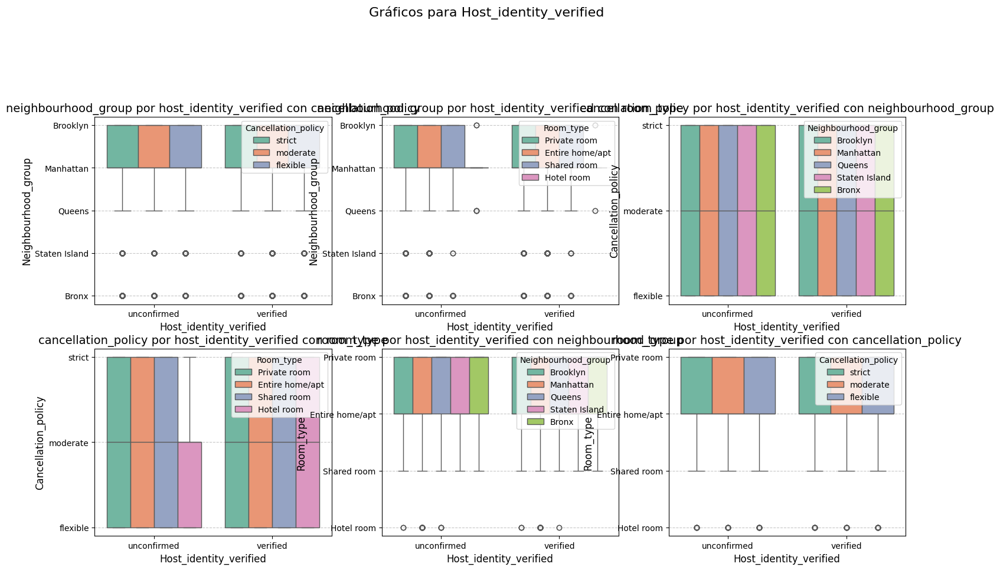

Generando gráficos para neighbourhood_group...
Gráfico guardado como: boxplot_neighbourhood_group.png


C:\Users\carol\AppData\Local\Temp\ipykernel_47236\1590444687.py:58: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


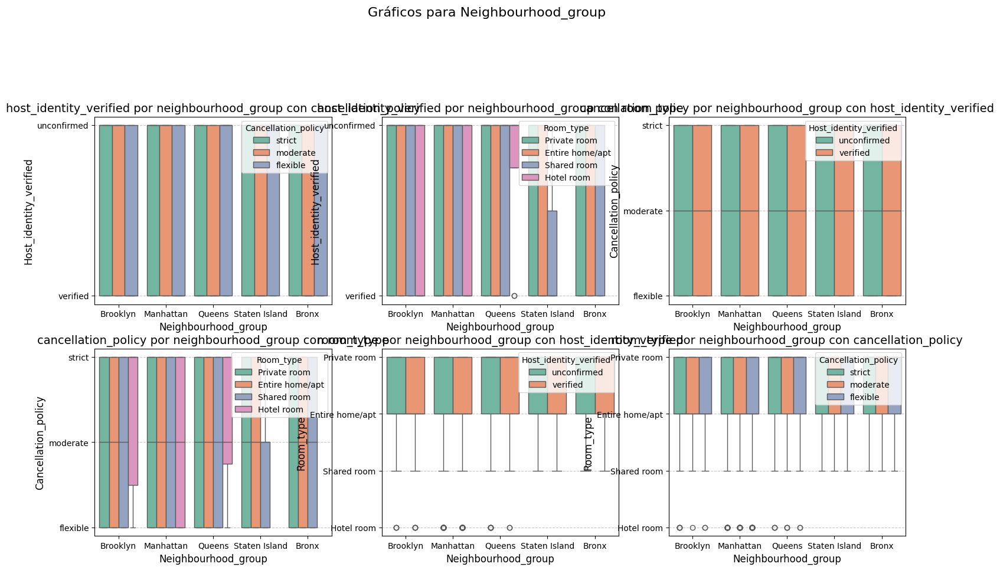

Generando gráficos para cancellation_policy...
Gráfico guardado como: boxplot_cancellation_policy.png


C:\Users\carol\AppData\Local\Temp\ipykernel_47236\1590444687.py:58: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


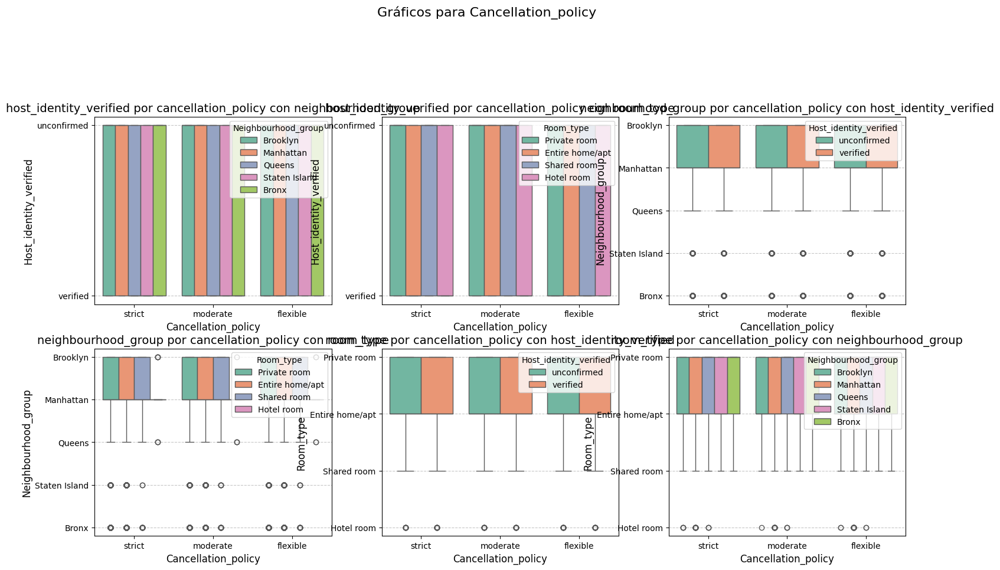

Generando gráficos para room_type...
Gráfico guardado como: boxplot_room_type.png


C:\Users\carol\AppData\Local\Temp\ipykernel_47236\1590444687.py:58: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


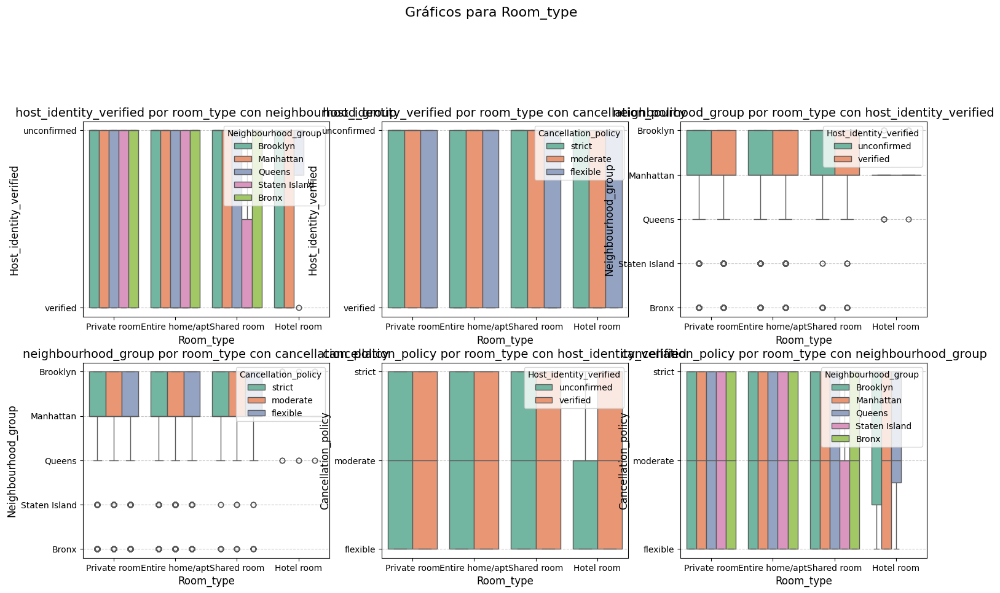

In [51]:
# HACER TODOS LOS BOXPLOT DE TODAS LAS COMBINACIONES
# Obtener las columnas categóricas
#categorical_columns = df.select_dtypes(include=['object', 'category']).columns
print(f"Columnas categóricas útiles: {categorical_columns_util}")
print(f"Total de columnas categóricas útiles: {len(categorical_columns_util)}")

# Generar combinaciones únicas manualmente
combinations = []
for x_col in categorical_columns_util:
    for y_col in categorical_columns_util:
        for hue_col in categorical_columns_util:
            if x_col != y_col and x_col != hue_col and y_col != hue_col:
                combinations.append((x_col, y_col, hue_col))

print(f"Total de combinaciones generadas: {len(combinations)}")

# Agrupar combinaciones por x_col
grouped_combinations = {}
for x_col, y_col, hue_col in combinations:
    if x_col not in grouped_combinations:
        grouped_combinations[x_col] = []
    grouped_combinations[x_col].append((y_col, hue_col))

# Generar figuras separadas por x_col
for x_col, group in grouped_combinations.items():
    print(f"Generando gráficos para {x_col}...")
    
    n_cols = 3  # Número de columnas por fila
    n_rows = (len(group) + n_cols - 1) // n_cols  # Calcular el número de filas necesario
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5 * n_rows), constrained_layout=True)
    axes = axes.flatten()  # Aplanar el arreglo de ejes
    
    for idx, (y_col, hue_col) in enumerate(group):
        ax = axes[idx]
        
        # Crear el boxplot
        sns.boxplot(data=df, x=x_col, y=y_col, hue=hue_col, palette='Set2', ax=ax)
        
        # Configurar el título y etiquetas
        ax.set_title(f"{y_col} por {x_col} con {hue_col}", fontsize=14)
        ax.set_xlabel(x_col.capitalize(), fontsize=12)
        ax.set_ylabel(y_col.capitalize(), fontsize=12)
        ax.legend(title=hue_col.capitalize(), loc='upper right')
        ax.grid(axis='y', linestyle='--', alpha=0.7)
    
    # Ocultar subplots adicionales si sobran
    for j in range(len(group), len(axes)):
        fig.delaxes(axes[j])
    
    # Guardar la figura como archivo
    filename = f"boxplot_{x_col}.png"
    plt.suptitle(f"Gráficos para {x_col.capitalize()}", fontsize=16, y=1.02)
    plt.savefig(filename, dpi=300, bbox_inches="tight")
    print(f"Gráfico guardado como: {filename}")
   
    # Mostrar la figura
    plt.suptitle(f"Gráficos para {x_col.capitalize()}", fontsize=16, y=1.02)
    plt.tight_layout()
    plt.show()

### 2️⃣ Análisis Bivariante (Scatterplots)
Analizamos relaciones entre dos variables.

TO DO: faltan scatter plots !! los mas importantes: 

* precio con latitud
* precio con longitud
* politicas con latitud y longitud
* precio por tipo de habitacion

* dia, mes, año por precio, por reseñas


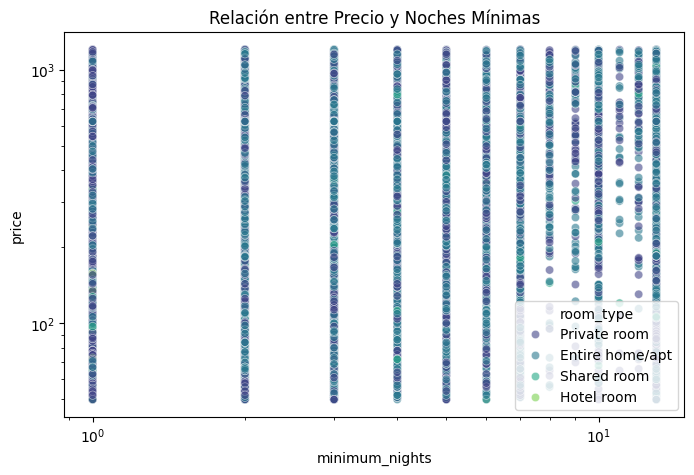

In [52]:
# Scatterplot: Precio vs Mínimo de Noches
plt.figure(figsize=(8, 5))
sns.scatterplot(data=df, x='minimum_nights', y='price', hue='room_type', alpha=0.6, palette='viridis')
plt.title("Relación entre Precio y Noches Mínimas")
plt.xscale("log")  # Escala logarítmica para mejor visualización
plt.yscale("log")
plt.show()


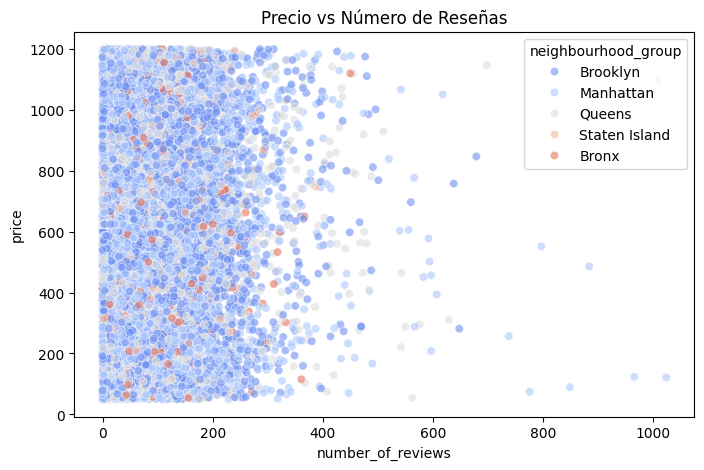

In [53]:
# Scatterplot: Precio vs Número de Reseñas
plt.figure(figsize=(8, 5))
sns.scatterplot(data=df, x='number_of_reviews', y='price', hue='neighbourhood_group', alpha=0.6, palette='coolwarm')
plt.title("Precio vs Número de Reseñas")
plt.show()

In [54]:
df.head(4)

,host_identity_verified,neighbourhood_group,neighbourhood,lat,long,instant_bookable,cancellation_policy,room_type,construction_year,price,...,minimum_nights,number_of_reviews,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365,house_rules,review_year,review_month,review_day
0,unconfirmed,Brooklyn,Kensington,40.64749,-73.97237,False,strict,Private room,2020.0,966.0,...,10.0,9.0,0.21,4.0,6.0,286.0,Clean up and treat the home the way you'd like...,2021,10,19
1,verified,Manhattan,Midtown,40.75362,-73.98377,False,moderate,Entire home/apt,2007.0,142.0,...,13.0,45.0,0.38,4.0,2.0,228.0,Pet friendly but please confirm with me if the...,2022,5,21
2,unconfirmed,Manhattan,Harlem,40.80902,-73.94190,True,flexible,Private room,2005.0,620.0,...,3.0,0.0,0.79,5.0,1.0,352.0,"I encourage you to use my kitchen, cooking and...",2019,6,14
3,unconfirmed,Brooklyn,Clinton_Hill,40.68514,-73.95976,True,moderate,Entire home/apt,2005.0,368.0,...,13.0,270.0,4.64,4.0,1.0,322.0,blank,2019,7,5


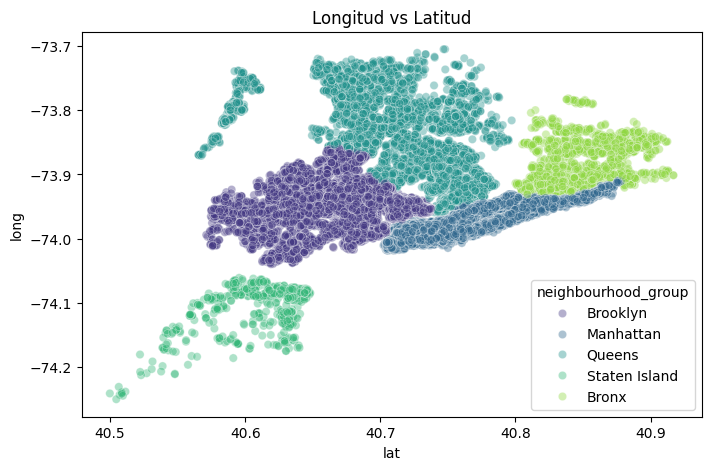

In [78]:
# to do hacer plot de latitud frente a lingutud. Hacer hue por precio, otro por tipo de habitacion ,otro por valoracion, por mes, por visitas
# Scatterplot: Latitud vs Longitud
plt.figure(figsize=(8, 5))
sns.scatterplot(data=df, x='lat', y='long', hue='neighbourhood_group', alpha=0.4, palette='viridis')
plt.title("Longitud vs Latitud")
plt.show()

In [56]:
'''import gc

gc.collect()

import geopandas
import geoplot
import contextily as cx

boroughs = geopandas.read_file(geoplot.datasets.get_path('nyc_boroughs'))
geo_df=geopandas.GeoDataFrame(df,geometry=geopandas.points_from_xy(df["long"], df["lat"]))
fig,ax=plt.subplots(figsize=(15,15))
boroughs.plot(ax=ax, alpha=0.5, edgecolor='k')
cx.add_basemap(ax, crs=boroughs.crs)
geo_df.plot(ax=ax,markersize=1, alpha=0.4,color="red")
plt.title('All Airbnb listings on the NYC map')
fig.show()'''

'import gc\n\ngc.collect()\n\nimport geopandas\nimport geoplot\nimport contextily as cx\n\nboroughs = geopandas.read_file(geoplot.datasets.get_path(\'nyc_boroughs\'))\ngeo_df=geopandas.GeoDataFrame(df,geometry=geopandas.points_from_xy(df["long"], df["lat"]))\nfig,ax=plt.subplots(figsize=(15,15))\nboroughs.plot(ax=ax, alpha=0.5, edgecolor=\'k\')\ncx.add_basemap(ax, crs=boroughs.crs)\ngeo_df.plot(ax=ax,markersize=1, alpha=0.4,color="red")\nplt.title(\'All Airbnb listings on the NYC map\')\nfig.show()'

### 3️⃣ Análisis Multivariante (Heatmap, Pairplot)
Exploramos correlaciones y relaciones entre múltiples variables.

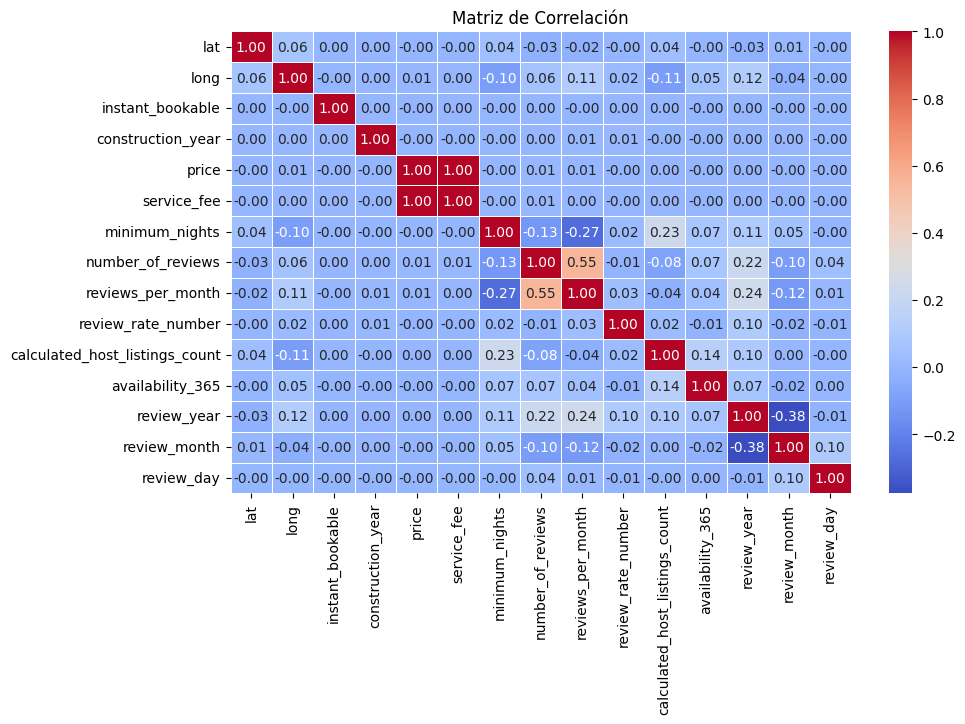

In [57]:
# Matriz de Correlación (Heatmap)
plt.figure(figsize=(10, 6))
sns.heatmap(df[numerical_columns].corr(), annot=True, cmap="coolwarm", linewidths=0.5, fmt=".2f")
plt.title("Matriz de Correlación")
plt.show()

cierta correlacion entre:

* longitud - reviews por mes, review_year, calculated_host_lintings_count
* el año de construccion no correlaciona nada
* el precio tampoco
* numero minimo de noches con - reviews_per_month, calculated_host_listings_count, review_year
* n´mero de reviews con - minimo de noches, reviews_per_month, review_year, review_month (una inversa de la otra)
* reviews_per_month con - review_year, review_month
* calculated_host_lintings_count - availability_365, review_year
* review_year - review_month


In [58]:
'''# Ajuste del tamaño de la figura
plt.figure(figsize=(12, 10))
# Generación del pairplot con mejoras visuales
pairplot = sns.pairplot(df, palette="viridis", diag_kind="kde",
                        plot_kws={'alpha': 0.7, 's': 20, 'edgecolor': 'k'},  # Ajustes para los scatterplots
                        diag_kws={'fill': True})  # Ajustes para los KDEs
# Título general con mejor posicionamiento
pairplot.fig.suptitle("Pairplot de todas las Variables", fontsize=16, y=1.02)
# Ajuste del tamaño de las etiquetas de los ejes
for ax in pairplot.axes.flat:
    if ax:
        ax.set_xlabel(ax.get_xlabel(), fontsize=10)
        ax.set_ylabel(ax.get_ylabel(), fontsize=10)

# Ajuste del diseño para evitar recortes
plt.tight_layout()

# Guardar la figura con un nombre descriptivo
plt.savefig("pairplot_variables.png", bbox_inches='tight')

# Visualización del gráfico
plt.show()'''

'# Ajuste del tamaño de la figura\nplt.figure(figsize=(12, 10))\n# Generación del pairplot con mejoras visuales\npairplot = sns.pairplot(df, palette="viridis", diag_kind="kde",\n                        plot_kws={\'alpha\': 0.7, \'s\': 20, \'edgecolor\': \'k\'},  # Ajustes para los scatterplots\n                        diag_kws={\'fill\': True})  # Ajustes para los KDEs\n# Título general con mejor posicionamiento\npairplot.fig.suptitle("Pairplot de todas las Variables", fontsize=16, y=1.02)\n# Ajuste del tamaño de las etiquetas de los ejes\nfor ax in pairplot.axes.flat:\n    if ax:\n        ax.set_xlabel(ax.get_xlabel(), fontsize=10)\n        ax.set_ylabel(ax.get_ylabel(), fontsize=10)\n\n# Ajuste del diseño para evitar recortes\nplt.tight_layout()\n\n# Guardar la figura con un nombre descriptivo\nplt.savefig("pairplot_variables.png", bbox_inches=\'tight\')\n\n# Visualización del gráfico\nplt.show()'

Columnas categóricas útiles: ['host_identity_verified', 'neighbourhood_group', 'cancellation_policy', 'room_type']


In [59]:
'''# Ajuste del tamaño de la figura
plt.figure(figsize=(15, 12))
# Generación del pairplot con mejoras visuales
pairplot = sns.pairplot(df, vars=numerical_columns, hue="neighbourhood_group", palette="Set2", diag_kind="kde",
                        plot_kws={'alpha': 0.6, 's': 15, 'edgecolor': 'k', 'linewidth': 0.5},  # Ajustes para los scatterplots
                        diag_kws={'fill': True, 'alpha': 0.3})  # Ajustes para los KDEs

# Título general con mejor posicionamiento
pairplot.fig.suptitle("Pairplot de Variables numéricas por Vecindario", fontsize=16, y=1.02)

# Mejora en la posición de la leyenda
pairplot._legend.set_bbox_to_anchor((1.05, 1))

# Ajuste del tamaño de las etiquetas de los ejes
for ax in pairplot.axes.flat:
    if ax:
        ax.set_xlabel(ax.get_xlabel(), fontsize=10)
        ax.set_ylabel(ax.get_ylabel(), fontsize=10)

# Ajuste del diseño para evitar recortes
plt.tight_layout(rect=[0, 0, 0.95, 1])  # Ajuste para la leyenda

# Guardar la figura con un nombre descriptivo
plt.savefig("pairplot_numericas_vecindario.png", bbox_inches='tight')

# Visualización del gráfico
plt.show()'''

'# Ajuste del tamaño de la figura\nplt.figure(figsize=(15, 12))\n# Generación del pairplot con mejoras visuales\npairplot = sns.pairplot(df, vars=numerical_columns, hue="neighbourhood_group", palette="Set2", diag_kind="kde",\n                        plot_kws={\'alpha\': 0.6, \'s\': 15, \'edgecolor\': \'k\', \'linewidth\': 0.5},  # Ajustes para los scatterplots\n                        diag_kws={\'fill\': True, \'alpha\': 0.3})  # Ajustes para los KDEs\n\n# Título general con mejor posicionamiento\npairplot.fig.suptitle("Pairplot de Variables numéricas por Vecindario", fontsize=16, y=1.02)\n\n# Mejora en la posición de la leyenda\npairplot._legend.set_bbox_to_anchor((1.05, 1))\n\n# Ajuste del tamaño de las etiquetas de los ejes\nfor ax in pairplot.axes.flat:\n    if ax:\n        ax.set_xlabel(ax.get_xlabel(), fontsize=10)\n        ax.set_ylabel(ax.get_ylabel(), fontsize=10)\n\n# Ajuste del diseño para evitar recortes\nplt.tight_layout(rect=[0, 0, 0.95, 1])  # Ajuste para la leyenda\n\n#

C:\Users\carol\AppData\Local\Temp\ipykernel_47236\1694647557.py:4: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


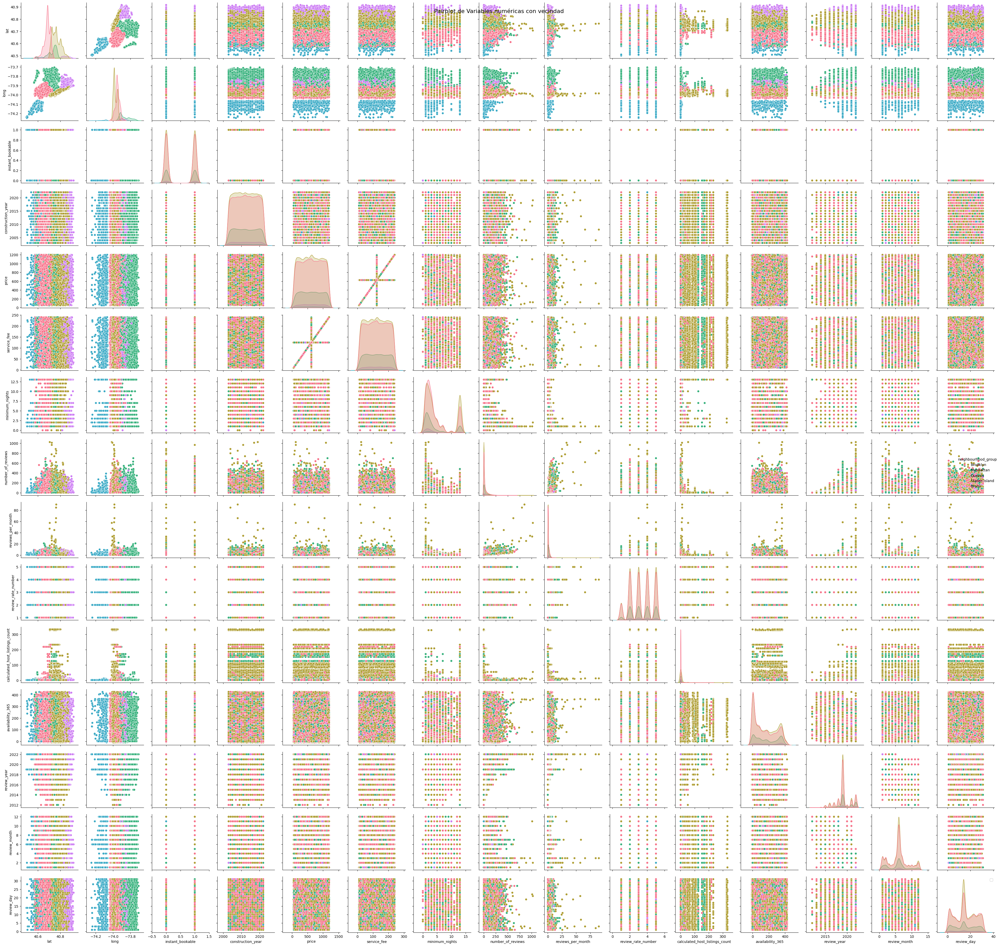

In [60]:
# Pairplot para visualizar relaciones entre todas las variables, por categóricas
sns.pairplot(df, vars=numerical_columns, hue="neighbourhood_group", palette="husl", diag_kind="kde")
plt.suptitle("Pairplot de Variables numéricas con vecindad", fontsize=16)
plt.legend()
plt.tight_layout()
plt.show()

In [61]:
'''# Ajuste del tamaño de la figura
plt.figure(figsize=(15, 12))

# Generación del pairplot con mejoras visuales
pairplot = sns.pairplot(df, vars=numerical_columns, hue="host_identity_verified", palette="Set2", diag_kind="kde",
                        plot_kws={'alpha': 0.6, 's': 15, 'edgecolor': 'k', 'linewidth': 0.5},  # Ajustes para los scatterplots
                        diag_kws={'fill': True, 'alpha': 0.3})  # Ajustes para los KDEs

# Título general con mejor posicionamiento
pairplot.fig.suptitle("Pairplot de Variables numéricas por Verificación de Identidad del Anfitrión", fontsize=16, y=1.02)

# Mejora en la posición de la leyenda
pairplot._legend.set_bbox_to_anchor((1.05, 1))

# Ajuste del tamaño de las etiquetas de los ejes
for ax in pairplot.axes.flat:
    if ax:
        ax.set_xlabel(ax.get_xlabel(), fontsize=10)
        ax.set_ylabel(ax.get_ylabel(), fontsize=10)

# Ajuste del diseño para evitar recortes
plt.tight_layout(rect=[0, 0, 0.95, 1])  # Ajuste para la leyenda

# Guardar la figura con un nombre descriptivo
plt.savefig("pairplot_numericas_verificacion_anfitrion.png", bbox_inches='tight')

# Visualización del gráfico
plt.show()'''

'# Ajuste del tamaño de la figura\nplt.figure(figsize=(15, 12))\n\n# Generación del pairplot con mejoras visuales\npairplot = sns.pairplot(df, vars=numerical_columns, hue="host_identity_verified", palette="Set2", diag_kind="kde",\n                        plot_kws={\'alpha\': 0.6, \'s\': 15, \'edgecolor\': \'k\', \'linewidth\': 0.5},  # Ajustes para los scatterplots\n                        diag_kws={\'fill\': True, \'alpha\': 0.3})  # Ajustes para los KDEs\n\n# Título general con mejor posicionamiento\npairplot.fig.suptitle("Pairplot de Variables numéricas por Verificación de Identidad del Anfitrión", fontsize=16, y=1.02)\n\n# Mejora en la posición de la leyenda\npairplot._legend.set_bbox_to_anchor((1.05, 1))\n\n# Ajuste del tamaño de las etiquetas de los ejes\nfor ax in pairplot.axes.flat:\n    if ax:\n        ax.set_xlabel(ax.get_xlabel(), fontsize=10)\n        ax.set_ylabel(ax.get_ylabel(), fontsize=10)\n\n# Ajuste del diseño para evitar recortes\nplt.tight_layout(rect=[0, 0, 0.95, 

In [62]:
'''# Pairplot para visualizar relaciones entre todas las variables, por categóricas
sns.pairplot(df,vars=numerical_columns, hue="host_identity_verified", palette="Set2", diag_kind="kde")
plt.suptitle("Pairplot de Variables numéricas con verificacion", fontsize=16)
plt.legend()
plt.tight_layout()
plt.show()'''

'# Pairplot para visualizar relaciones entre todas las variables, por categóricas\nsns.pairplot(df,vars=numerical_columns, hue="host_identity_verified", palette="Set2", diag_kind="kde")\nplt.suptitle("Pairplot de Variables numéricas con verificacion", fontsize=16)\nplt.legend()\nplt.tight_layout()\nplt.show()'

In [63]:
'''# Ajuste del tamaño de la figura
plt.figure(figsize=(15, 12))

# Generación del pairplot con mejoras visuales
pairplot = sns.pairplot(df, vars=numerical_columns, hue="cancellation_policy", palette="Set3", diag_kind="kde",
                        plot_kws={'alpha': 0.6, 's': 15, 'edgecolor': 'k', 'linewidth': 0.5},  # Ajustes para los scatterplots
                        diag_kws={'fill': True, 'alpha': 0.3})  # Ajustes para los KDEs

# Título general con mejor posicionamiento
pairplot.fig.suptitle("Pairplot de Variables numéricas por Política de Cancelación", fontsize=16, y=1.02)

# Mejora en la posición de la leyenda
pairplot._legend.set_bbox_to_anchor((1.05, 1))

# Ajuste del tamaño de las etiquetas de los ejes
for ax in pairplot.axes.flat:
    if ax:
        ax.set_xlabel(ax.get_xlabel(), fontsize=10)
        ax.set_ylabel(ax.get_ylabel(), fontsize=10)

# Ajuste del diseño para evitar recortes
plt.tight_layout(rect=[0, 0, 0.95, 1])  # Ajuste para la leyenda

# Guardar la figura con un nombre descriptivo
plt.savefig("pairplot_numericas_politica_cancelacion.png", bbox_inches='tight')

# Visualización del gráfico
plt.show()'''

'# Ajuste del tamaño de la figura\nplt.figure(figsize=(15, 12))\n\n# Generación del pairplot con mejoras visuales\npairplot = sns.pairplot(df, vars=numerical_columns, hue="cancellation_policy", palette="Set3", diag_kind="kde",\n                        plot_kws={\'alpha\': 0.6, \'s\': 15, \'edgecolor\': \'k\', \'linewidth\': 0.5},  # Ajustes para los scatterplots\n                        diag_kws={\'fill\': True, \'alpha\': 0.3})  # Ajustes para los KDEs\n\n# Título general con mejor posicionamiento\npairplot.fig.suptitle("Pairplot de Variables numéricas por Política de Cancelación", fontsize=16, y=1.02)\n\n# Mejora en la posición de la leyenda\npairplot._legend.set_bbox_to_anchor((1.05, 1))\n\n# Ajuste del tamaño de las etiquetas de los ejes\nfor ax in pairplot.axes.flat:\n    if ax:\n        ax.set_xlabel(ax.get_xlabel(), fontsize=10)\n        ax.set_ylabel(ax.get_ylabel(), fontsize=10)\n\n# Ajuste del diseño para evitar recortes\nplt.tight_layout(rect=[0, 0, 0.95, 1])  # Ajuste para 

In [64]:
'''# Pairplot para visualizar relaciones entre todas las variables, por categóricas
sns.pairplot(df,vars=numerical_columns,  hue="cancellation_policy", palette="Set3", diag_kind="kde")
plt.suptitle("Pairplot de Variables numéricas con política de cancelación", fontsize=16)
plt.tight_layout()
plt.legend()
plt.show()'''

'# Pairplot para visualizar relaciones entre todas las variables, por categóricas\nsns.pairplot(df,vars=numerical_columns,  hue="cancellation_policy", palette="Set3", diag_kind="kde")\nplt.suptitle("Pairplot de Variables numéricas con política de cancelación", fontsize=16)\nplt.tight_layout()\nplt.legend()\nplt.show()'

In [65]:
'''# Ajuste del tamaño de la figura
plt.figure(figsize=(15, 12))

# Generación del pairplot con mejoras visuales
pairplot = sns.pairplot(df, vars=numerical_columns, hue="room_type", palette="Set1", diag_kind="kde",
                        plot_kws={'alpha': 0.6, 's': 15, 'edgecolor': 'k', 'linewidth': 0.5},  # Ajustes para los scatterplots
                        diag_kws={'fill': True, 'alpha': 0.3})  # Ajustes para los KDEs

# Título general con mejor posicionamiento
pairplot.fig.suptitle("Pairplot de Variables numéricas por Tipo de Habitación", fontsize=16, y=1.02)

# Mejora en la posición de la leyenda
pairplot._legend.set_bbox_to_anchor((1.05, 1))

# Ajuste del tamaño de las etiquetas de los ejes
for ax in pairplot.axes.flat:
    if ax:
        ax.set_xlabel(ax.get_xlabel(), fontsize=10)
        ax.set_ylabel(ax.get_ylabel(), fontsize=10)

# Ajuste del diseño para evitar recortes
plt.tight_layout(rect=[0, 0, 0.95, 1])  # Ajuste para la leyenda

# Guardar la figura con un nombre descriptivo
plt.savefig("pairplot_numericas_tipo_habitacion.png", bbox_inches='tight')

# Visualización del gráfico
plt.show()'''

'# Ajuste del tamaño de la figura\nplt.figure(figsize=(15, 12))\n\n# Generación del pairplot con mejoras visuales\npairplot = sns.pairplot(df, vars=numerical_columns, hue="room_type", palette="Set1", diag_kind="kde",\n                        plot_kws={\'alpha\': 0.6, \'s\': 15, \'edgecolor\': \'k\', \'linewidth\': 0.5},  # Ajustes para los scatterplots\n                        diag_kws={\'fill\': True, \'alpha\': 0.3})  # Ajustes para los KDEs\n\n# Título general con mejor posicionamiento\npairplot.fig.suptitle("Pairplot de Variables numéricas por Tipo de Habitación", fontsize=16, y=1.02)\n\n# Mejora en la posición de la leyenda\npairplot._legend.set_bbox_to_anchor((1.05, 1))\n\n# Ajuste del tamaño de las etiquetas de los ejes\nfor ax in pairplot.axes.flat:\n    if ax:\n        ax.set_xlabel(ax.get_xlabel(), fontsize=10)\n        ax.set_ylabel(ax.get_ylabel(), fontsize=10)\n\n# Ajuste del diseño para evitar recortes\nplt.tight_layout(rect=[0, 0, 0.95, 1])  # Ajuste para la leyenda\n\n#

In [66]:
'''# Pairplot para visualizar relaciones entre todas las variables, por categóricas
sns.pairplot(df, vars=numerical_columns, hue="room_type", palette="Set1", diag_kind="kde")
plt.suptitle("Pairplot de Variables numéricas con tipo de habitación", fontsize=16)
plt.tight_layout()
plt.legend()
plt.show()'''

'# Pairplot para visualizar relaciones entre todas las variables, por categóricas\nsns.pairplot(df, vars=numerical_columns, hue="room_type", palette="Set1", diag_kind="kde")\nplt.suptitle("Pairplot de Variables numéricas con tipo de habitación", fontsize=16)\nplt.tight_layout()\nplt.legend()\nplt.show()'

<Figure size 1500x1200 with 0 Axes>

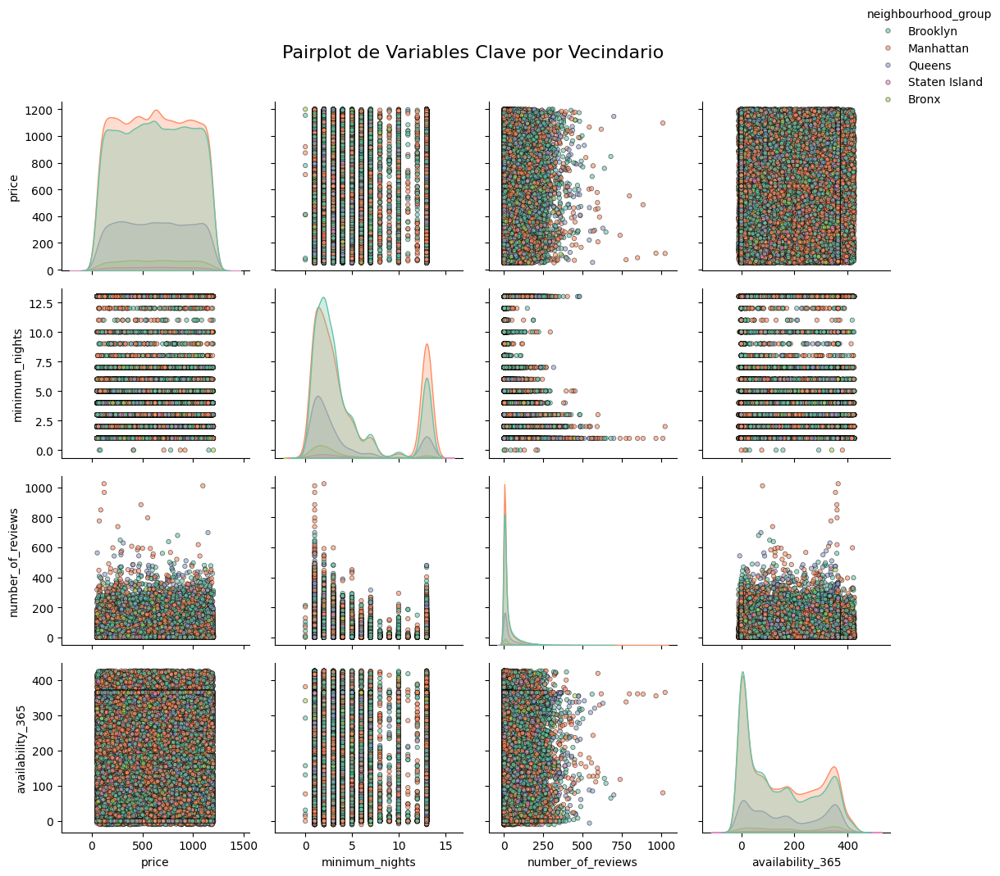

In [67]:
plt.figure(figsize=(15, 12))

# Generación del pairplot con mejoras visuales
pairplot = sns.pairplot(df, vars=['price', 'minimum_nights', 'number_of_reviews', 'availability_365'], hue="neighbourhood_group", palette="Set2", diag_kind="kde",
                        plot_kws={'alpha': 0.6, 's': 15, 'edgecolor': 'k', 'linewidth': 0.5},  # Ajustes para los scatterplots
                        diag_kws={'fill': True, 'alpha': 0.3})  # Ajustes para los KDEs

# Título general con mejor posicionamiento
pairplot.fig.suptitle("Pairplot de Variables Clave por Vecindario", fontsize=16, y=1.02)

pairplot._legend.set_bbox_to_anchor((1.05, 1))

# Ajuste del tamaño de las etiquetas de los ejes
for ax in pairplot.axes.flat:
    if ax:
        ax.set_xlabel(ax.get_xlabel(), fontsize=10)
        ax.set_ylabel(ax.get_ylabel(), fontsize=10)

# Ajuste del diseño para evitar recortes
plt.tight_layout(rect=[0, 0, 0.95, 1])  # Ajuste para la leyenda

# Guardar la figura con un nombre descriptivo
plt.savefig("pairplot_variables_clave_vecindario.png", bbox_inches='tight')

plt.show()

C:\Users\carol\AppData\Local\Temp\ipykernel_47236\1802446583.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=correlations_df, x='Correlation', y='Variable', palette='coolwarm', orient='h')


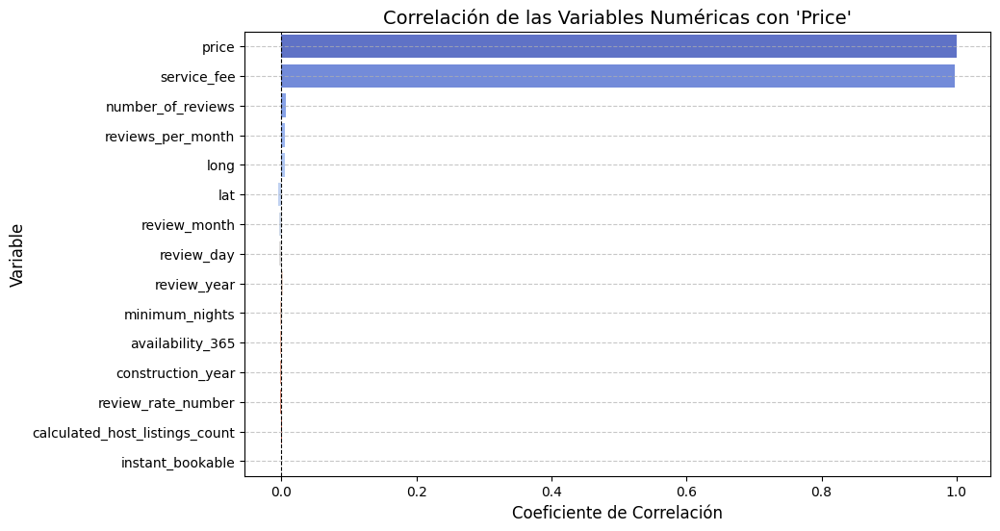

In [68]:
# Calcular la correlación con 'price'
correlations_with_price = df[numerical_columns].corrwith(df['price'])

# Crear un DataFrame para organizar los datos
correlations_df = correlations_with_price.reset_index()
correlations_df.columns = ['Variable', 'Correlation']

# Ordenar por valor absoluto de la correlación
correlations_df = correlations_df.sort_values(by='Correlation', key=abs, ascending=False)

# Graficar
plt.figure(figsize=(10, 6))
sns.barplot(data=correlations_df, x='Correlation', y='Variable', palette='coolwarm', orient='h')
plt.title("Correlación de las Variables Numéricas con 'Price'", fontsize=14)
plt.xlabel("Coeficiente de Correlación", fontsize=12)
plt.ylabel("Variable", fontsize=12)
plt.axvline(0, color='black', linestyle='--', linewidth=0.8)  # Línea vertical en 0
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Volvemos a comprobar la poca correlación que hay entre las columnas del dataset

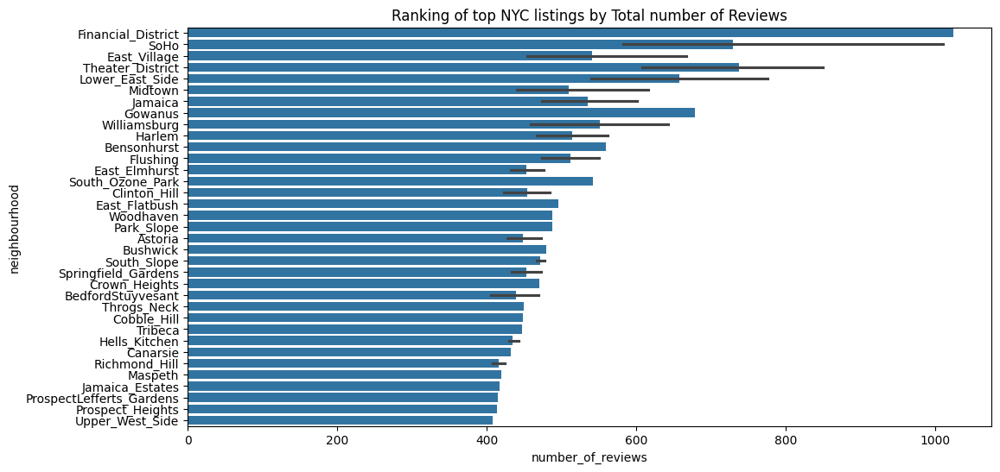

In [77]:
plt.figure(figsize=(12,6))
#temp = df.sort_values(by="number_of_reviews", axis=0, ascending=False).iloc[:20, :]
temp = df.sort_values(by="number_of_reviews", axis=0, ascending=False).iloc[:100, :]

sns.barplot(data=temp, y='neighbourhood', x='number_of_reviews')
plt.title('Ranking of top NYC listings by Total number of Reviews')
plt.show()

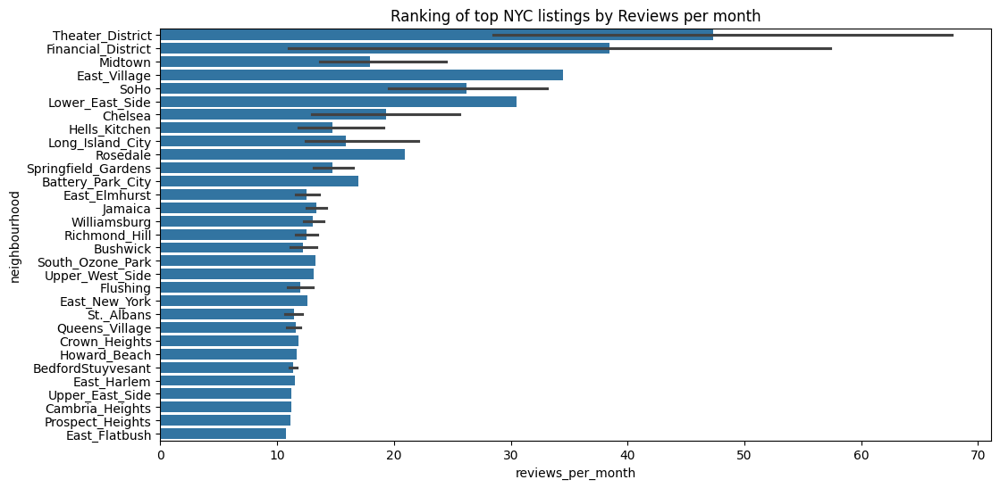

In [70]:
plt.figure(figsize=(12,6))
#temp = df.sort_values(by="reviews_per_month", axis=0, ascending=False).iloc[:20, :]
temp = df.sort_values(by="reviews_per_month", axis=0, ascending=False).iloc[:100, :]

sns.barplot(data=temp, y='neighbourhood', x='reviews_per_month')
plt.title('Ranking of top NYC listings by Reviews per month')
plt.show()

Columnas categóricas: ['host_identity_verified', 'neighbourhood_group', 'cancellation_policy', 'room_type']
Total de columnas categóricas: 4
Total de combinaciones generadas: 24
Generando gráficos para host_identity_verified...
Figura guardada como violinplots_host_identity_verified.png


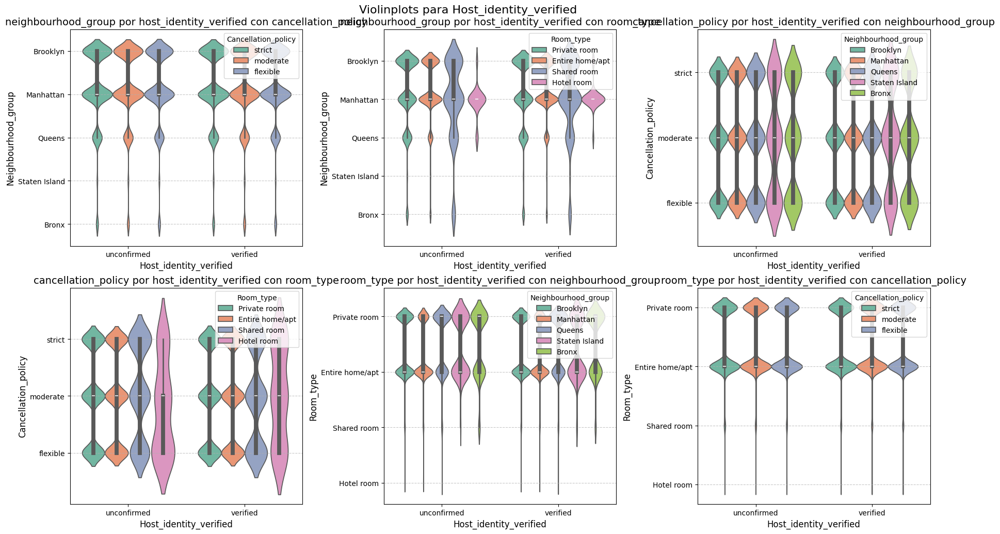

Generando gráficos para neighbourhood_group...
Figura guardada como violinplots_neighbourhood_group.png


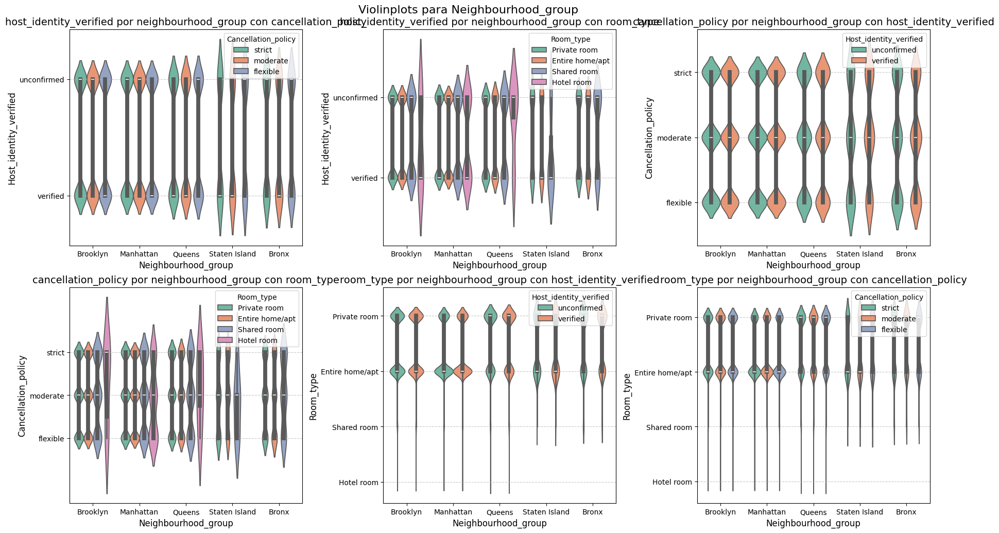

Generando gráficos para cancellation_policy...
Figura guardada como violinplots_cancellation_policy.png


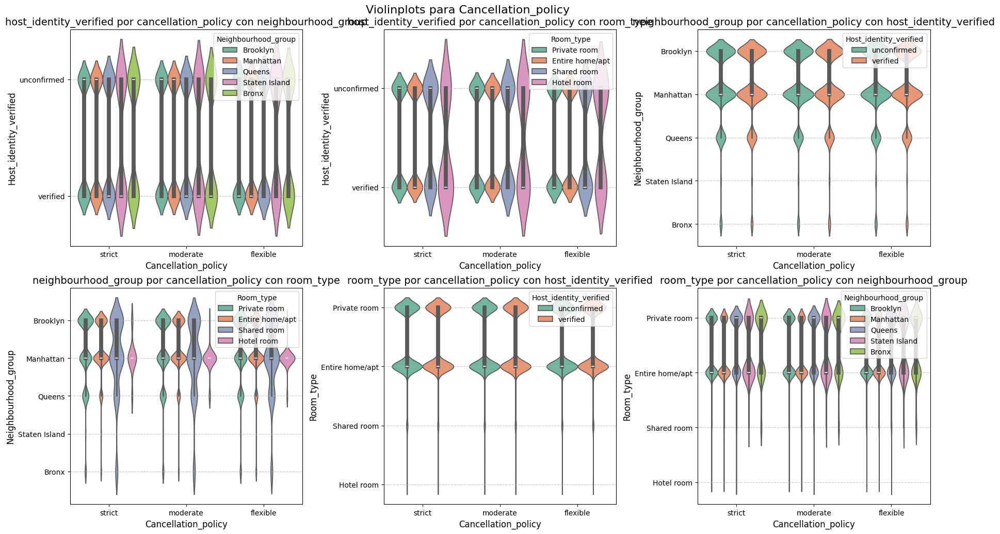

Generando gráficos para room_type...
Figura guardada como violinplots_room_type.png


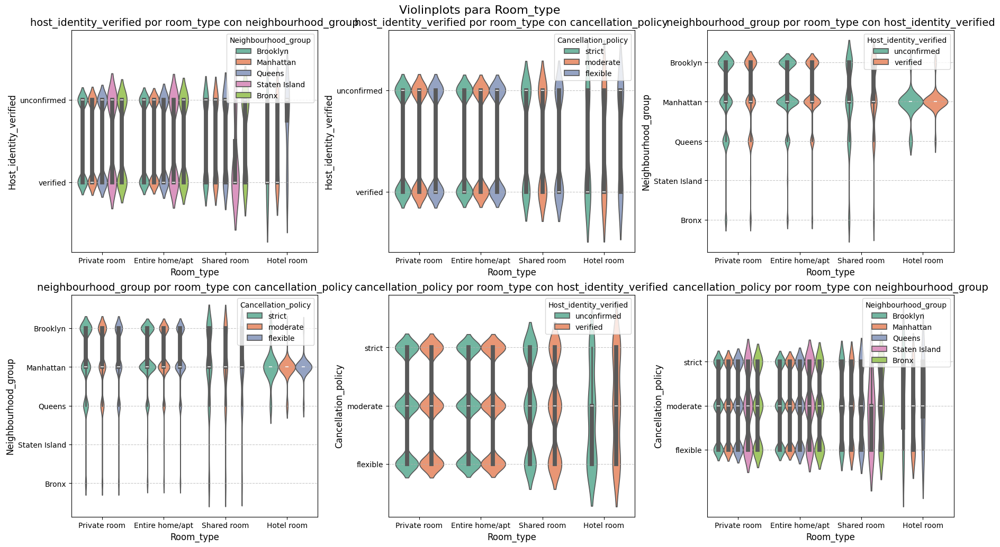

In [71]:
print(f"Columnas categóricas: {categorical_columns_util}")
print(f"Total de columnas categóricas: {len(categorical_columns_util)}")

# Crear combinaciones únicas para x, y, y hue
combinations = []
for x_col in categorical_columns_util:
    for y_col in categorical_columns_util:
        for hue_col in categorical_columns_util:
            if x_col != y_col and x_col != hue_col and y_col != hue_col:
                combinations.append((x_col, y_col, hue_col))

print(f"Total de combinaciones generadas: {len(combinations)}")

# Agrupar combinaciones por x_col
grouped_combinations = {}
for x_col, y_col, hue_col in combinations:
    if x_col not in grouped_combinations:
        grouped_combinations[x_col] = []
    grouped_combinations[x_col].append((y_col, hue_col))

# Generar figuras separadas por x_col
for x_col, group in grouped_combinations.items():
    print(f"Generando gráficos para {x_col}...")
    
    n_cols = 3  # Número de columnas por fila
    n_rows = (len(group) + n_cols - 1) // n_cols  # Calcular el número de filas necesario
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5 * n_rows), constrained_layout=True)
    axes = axes.flatten()  # Aplanar el arreglo de ejes
    
    for idx, (y_col, hue_col) in enumerate(group):
        ax = axes[idx]
        
        # Crear el violinplot
        sns.violinplot(data=df, x=x_col, y=y_col, hue=hue_col, palette='Set2', ax=ax)
        
        # Configurar el título y etiquetas
        ax.set_title(f"{y_col} por {x_col} con {hue_col}", fontsize=14)
        ax.set_xlabel(x_col.capitalize(), fontsize=12)
        ax.set_ylabel(y_col.capitalize(), fontsize=12)
        ax.legend(title=hue_col.capitalize(), loc='upper right')
        ax.grid(axis='y', linestyle='--', alpha=0.7)
    
    # Ocultar subplots adicionales si sobran
    for j in range(len(group), len(axes)):
        fig.delaxes(axes[j])
    
    # Guardar la figura en un archivo
    file_name = f"violinplots_{x_col}.png"
    plt.suptitle(f"Violinplots para {x_col.capitalize()}", fontsize=16, y=1.02)
    plt.savefig(file_name)
    print(f"Figura guardada como {file_name}")
    
    # Mostrar la figura
    plt.show()

In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, LabelEncoder, OneHotEncoder

def preprocesamiento_y_visualizacion_sin_guardar(df):
    """
    Preprocesa y visualiza datos automáticamente, guardando información sobre errores.

    Args:
        df (pd.DataFrame): El DataFrame de entrada.
    """

    # Listas para guardar información sobre errores
    encoders_fallidos = []
    plots_fallidos = []

    # 1. Separación de columnas numéricas y categóricas
    #numericas = df.select_dtypes(include=np.number).columns
    #categoricas = df.select_dtypes(exclude=np.number).columns

    print("Columnas Numéricas:", numerical_columns)
    print("Columnas Categóricas:", categorical_columns)
    # 2. Encoding de columnas categóricas
    for col in categorical_columns:
        try:
            if df[col].nunique() < 10:  # Umbral para encoding
                print(f"\nAplicando OneHotEncoding a: {col}")
                df = pd.get_dummies(df, columns=[col], drop_first=True)  # OneHotEncoding
            elif df[col].nunique() < 50:  # Otro umbral para Label Encoding
                print(f"\nAplicando LabelEncoding a: {col}")
                le = LabelEncoder()
                df[col] = le.fit_transform(df[col])
            else:
                print(f"\n********* No se aplica encoding a: {col} (demasiadas categorías)")
        except Exception as e:
            print(f"Error en encoding de {col}: {e}")
            encoders_fallidos.append((col, e))

    # 3. Escalado de columnas numéricas
    for col in numerical_columns:
        # Decidir el mejor scaler (basado en la distribución)
        if df[col].skew() < -1 or df[col].skew() > 1:  # Asimetría alta
            print(f"\nAplicando RobustScaler a: {col}")
            scaler = RobustScaler()
        elif df[col].kurt() > 5: # Kurtosis alta
            print(f"\nAplicando RobustScaler a: {col}")
            scaler = RobustScaler()
        else:
            print(f"\nAplicando StandardScaler a: {col}")
            scaler = StandardScaler()

        df[col] = scaler.fit_transform(df[[col]])

    # 4. Visualización
    for col1 in df.columns:
        for col2 in df.columns:
            if col1 != col2:
                try:
                    # Decidir el mejor tipo de visualización
                    if df[col1].dtype == np.number and df[col2].dtype == np.number:
                        if df[col1].nunique() < 200 and df[col2].nunique() < 200:
                            # Scatterplot con tamaño de puntos y color
                            plt.figure(figsize=(8, 6))  # Ajusta el tamaño de la figura si lo deseas
                            sns.scatterplot(x=col1, y=col2, data=df, s=10, hue=col1, palette="viridis")  # Tamaño de puntos: 20, color según col1
                            plt.title(f"Scatterplot: {col2} vs {col1}")
                        else:
                            # Lineplot con color
                            plt.figure(figsize=(8, 6))  # Ajusta el tamaño de la figura si lo deseas
                            sns.lineplot(x=col1, y=col2, data=df, hue=col1, palette="viridis")  # Color según col1
                            plt.title(f"Lineplot: {col2} vs {col1}")
                    elif df[col1].dtype == np.number and df[col2].dtype != np.number:
                        # Boxplot con color
                        plt.figure(figsize=(8, 6))  # Ajusta el tamaño de la figura si lo deseas
                        sns.boxplot(x=col2, y=col1, data=df, palette="viridis")  # Puedes añadir 'hue' si lo deseas
                        plt.title(f"Boxplot: {col2} vs {col1}")
                    elif df[col1].dtype != np.number and df[col2].dtype == np.number:
                        # Boxplot con color
                        plt.figure(figsize=(8, 6))  # Ajusta el tamaño de la figura si lo deseas
                        sns.boxplot(x=col1, y=col2, data=df, palette="viridis")  # Puedes añadir 'hue' si lo deseas
                        plt.title(f"Boxplot: {col2} vs {col1}")
                    else:
                        # Heatmap con color
                        plt.figure(figsize=(8, 6))  # Ajusta el tamaño de la figura si lo deseas
                        contingency_table = pd.crosstab(df[col1], df[col2])
                        sns.heatmap(contingency_table, annot=True, cmap="viridis")  # Mapa de calor con paleta de colores
                        plt.title(f"Relación entre {col2} y {col1}")

                    plt.xticks(rotation=45, ha='right')
                    plt.tight_layout()
                    plt.show()
                except Exception as e:
                    print(f"Error en plot de {col2} vs {col1}: {e}")
                    plots_fallidos.append(((col1, col2), e))

    # Imprimir información sobre errores
    if encoders_fallidos:
        return encoders_fallidos
        print("\nENCODERS FALLIDOS:")
        for col, error in encoders_fallidos:
            print(f"Columna: {col}, Error: {error}")

    if plots_fallidos:
        return plots_fallidos
        print("\nPLOTS FALLIDOS:")
        for (col1, col2), error in plots_fallidos:
            print(f"Plot: {col2} vs {col1}, Error: {error}")


# Ejemplo de uso
# df = pd.read_csv("tu_archivo.csv")  # Reemplaza con tu archivo
# preprocesamiento_y_visualizacion_sin_guardar(df.copy())  # Usa una copia para no modificar el DataFrame original

In [73]:
#preprocesamiento_y_visualizacion_sin_guardar(df)


## Explicación detallada

1.  **Separación de columnas:** Se utilizan `select_dtypes` para identificar automáticamente columnas numéricas y categóricas.

2.  **Encoding:** Se aplican reglas basadas en la cantidad de valores únicos (`nunique()`) para decidir si usar OneHotEncoding o LabelEncoding. Si una columna tiene demasiadas categorías (más de 50 por ejemplo), se omite el encoding.

3.  **Escalado:** Se utilizan reglas basadas en la asimetría (`skew()`) y la curtosis (`kurt()`) para decidir el mejor scaler para cada columna numérica. Si la asimetría es alta (mayor a 1 o menor a -1) o la curtosis es muy alta (mayor a 5), se usa `RobustScaler` para mitigar el efecto de los outliers. Si no, se usa `StandardScaler`.

4.  **Visualización:** Se utilizan reglas basadas en el tipo de datos y la cantidad de valores únicos para decidir el mejor tipo de gráfico para cada combinación de columnas. Se priorizan scatterplots si ambas son numéricas y tienen pocos valores únicos, boxplots para numérica vs categórica, y mapas de calor para ambas categóricas.

## Recomendaciones adicionales

*   **Ajuste de umbrales:** Puedes ajustar los umbrales para encoding y escalado según tus datos específicos.
*   **Manejo de valores faltantes:** Considera agregar un paso para manejar valores faltantes antes del encoding y escalado.
*   **Más opciones de visualización:** Puedes agregar más opciones de visualización (por ejemplo, histogramas, gráficos de densidad) según tus necesidades.
*   **Evaluación del rendimiento:** Si estás utilizando estos datos para modelado, recuerda evaluar el rendimiento de tus modelos con diferentes opciones de preprocesamiento.

¡Espero que este programa te sea útil! Si tienes alguna otra pregunta, no dudes en consultarme.


In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, LabelEncoder, OneHotEncoder
import os

def preprocesamiento_y_visualizacion_guardando(df, carpeta_destino="plots"):
    """
    Preprocesa y visualiza datos automáticamente, guardando los plots.

    Args:
        df (pd.DataFrame): El DataFrame de entrada.
        carpeta_destino (str): Carpeta donde se guardarán los plots.
    """

    # Crear la carpeta de destino si no existe
    if not os.path.exists(carpeta_destino):
        os.makedirs(carpeta_destino)

    # 1. Separación de columnas numéricas y categóricas hecho anteriormente

    print("Columnas Numéricas:", numerical_columns)
    print("Columnas Categóricas:", categorical_columns)

    # 2. Encoding de columnas categóricas
    # ... (código igual que antes)
    # 2. Encoding de columnas categóricas
    for col in categorical_columns:
        if df[col].nunique() < 10:  # Umbral para encoding
            print(f"Aplicando OneHotEncoding a: {col}")
            df = pd.get_dummies(df, columns=[col], drop_first=True)  # OneHotEncoding
        elif df[col].nunique() < 50:  # Otro umbral para Label Encoding
            print(f"Aplicando LabelEncoding a: {col}")
            le = LabelEncoder()
            df[col] = le.fit_transform(df[col])
        else:
            print(f"No se aplica encoding a: {col} (demasiadas categorías)")

    # 3. Escalado de columnas numéricas
    for col in numerical_columns:
        # Decidir el mejor scaler (basado en la distribución)
        if df[col].skew() < -1 or df[col].skew() > 1:  # Asimetría alta
            print(f"Aplicando RobustScaler a: {col}")
            scaler = RobustScaler()
        elif df[col].kurt() > 5: # Kurtosis alta
            print(f"Aplicando RobustScaler a: {col}")
            scaler = RobustScaler()
        else:
            print(f"Aplicando StandardScaler a: {col}")
            scaler = StandardScaler()

        df[col] = scaler.fit_transform(df[[col]])


    # 3. Escalado de columnas numéricas
    # ... (código igual que antes)

    # 4. Visualización
    for col1 in df.columns:
        for col2 in df.columns:
            if col1 != col2:
                # Decidir el mejor tipo de visualización
                if df[col1].dtype == np.number and df[col2].dtype == np.number:
                    if df[col1].nunique() < 20 and df[col2].nunique() < 20:
                        tipo_plot = "scatterplot"
                    else:
                        tipo_plot = "lineplot"
                elif df[col1].dtype == np.number and df[col2].dtype != np.number:
                    tipo_plot = "boxplot"
                elif df[col1].dtype != np.number and df[col2].dtype == np.number:
                    tipo_plot = "boxplot"
                else:
                    tipo_plot = "heatmap"

                # Crear el nombre del archivo
                nombre_archivo = f"{tipo_plot}_{col1}_vs_{col2}.png"
                ruta_archivo = os.path.join(carpeta_destino, nombre_archivo)

                # Crear el plot y guardarlo
                plt.figure()  # Crear una nueva figura para cada plot
                if tipo_plot == "scatterplot":
                    sns.scatterplot(x=col1, y=col2, data=df)
                elif tipo_plot == "lineplot":
                    sns.lineplot(x=col1, y=col2, data=df)
                elif tipo_plot == "boxplot":
                    if df[col1].dtype == np.number:
                        sns.boxplot(x=col2, y=col1, data=df)
                    else:
                        sns.boxplot(x=col1, y=col2, data=df)
                else:
                    contingency_table = pd.crosstab(df[col1], df[col2])
                    sns.heatmap(contingency_table, annot=True, cmap="YlGnBu")

                plt.title(f"{tipo_plot.capitalize()}: {col1} vs {col2}")
                plt.xticks(rotation=45, ha='right')
                plt.tight_layout()
                plt.savefig(ruta_archivo)  # Guardar el plot
                plt.show()
                plt.close()  # Cerrar la figura para liberar memoria

                print(f"Plot guardado: {nombre_archivo}")


In [75]:
#preprocesamiento_y_visualizacion_guardando(df, 'output')

## Continúo el análisis en el siguiente archivo